In [2]:
%load_ext autoreload
%autoreload 2
import os
import pandas as pd
from musint.datasets.babel_dataset import BabelDataset
from musint.datasets.amass_dataset import get_feat_p
import torch
import torch.nn.functional as F

from musint.benchmarks.muscle_sets import MUSCLE_SUBSETS

print(MUSCLE_SUBSETS.keys())

dict_keys(['LAI_ARNOLD_LOWER_BODY_8', 'LAI_ARNOLD_LOWER_BODY_16', 'LU_MUSCLES', 'TL_MUSCLES', 'MUSINT_402'])


In [3]:
babel_root = "/lsdf/data/activity/BABEL/babel_v1-0_release"

babel_paths = [
    os.path.join(babel_root, "train.json"),
    os.path.join(babel_root, "val.json"),
    os.path.join(babel_root, "test.json"),
    os.path.join(babel_root, "extra_train.json"),
    os.path.join(babel_root, "extra_val.json"),
]

babel_dataset = BabelDataset.from_datasets([BabelDataset.from_json_file(bp) for bp in babel_paths])

Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 1703, len(frame_ann_data): 5
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 8165, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 5211, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 12633, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 1432, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 4857, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 11852, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 10436, len(frame_ann_data): 4
Frame annotations are ambiguous. Choosing first annotation. Split: None, babel_sid 3105, len(frame_an

In [4]:
def load_muscle_activations_meta(
    csv_path,
):
    all_segments = pd.read_csv(csv_path)

    all_segments = all_segments.astype(str)  # Change all other columns to str
    all_segments[["height_cm", "weight_kg", "babel_sid"]] = all_segments[
        ["height_cm", "weight_kg", "babel_sid"]
    ].astype(float)
    all_segments["babel_sid"] = all_segments["babel_sid"].fillna(-1)
    all_segments[["babel_sid"]] = all_segments[["babel_sid"]].astype(int)

    return all_segments


# Load Muscle Activation Data
muscle_activations = load_muscle_activations_meta(
    csv_path=os.path.expandvars("$LSDF/data/activity/MuscleSim/MusclesInTime.csv")
)

muscle_activations.iloc[0]["data_path"]

'rub029/0020_lifting_heavy2_poses/muscle_activations.pkl'

In [5]:
def find_strings(data):
    strings = []

    def recurse(item):
        if isinstance(item, (list, tuple)):
            for sub_item in item:
                recurse(sub_item)
        elif isinstance(item, str):
            strings.append(item)

    recurse(data)
    return strings

In [6]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
import pandas as pd
from musint.benchmarks.muscle_sets import MUSCLE_SUBSETS

# from musint.muscle_groups.lu_muscle_groups import knee_flexion_l_muscles

muscle_act_root = "/lsdf/users/mkugler/repositories/MuscleChat/output/transformer/output/transformer/16_trans_layers_256_width_28frames_2/muscle_activation/transformer"

metadata_df = pd.read_csv(
    "/lsdf/users/mkugler/repositories/MuscleChat/output/vqvae/vqvae/VQVAE/metadata.csv"
)  # Does not need to be changed (should be same for all models)

channel_annotations = MUSCLE_SUBSETS["MUSINT_402"]

with open(
    os.path.expandvars(
        "$LSDF/data/activity/MuscleSim/" + metadata_df.iloc[0]["name"] + "_poses/muscle_activations.pkl"
    ),
    "rb",
) as f:
    muscle_df: pd.DataFrame = pickle.load(f)

muscle_df = muscle_df[channel_annotations]

In [7]:
def compute_loss(Loss, pred_muscle_act, gt_muscle_act):
    loss_muscle_act = Loss.forward_naive(pred_muscle_act, gt_muscle_act)
    return loss_muscle_act

In [8]:
import torch


def pearson_corr(x, y):
    # x and y are of shape (B, T, C)
    B, T, C = x.shape

    mean_x = torch.mean(x, dim=1, keepdim=True)
    mean_y = torch.mean(y, dim=1, keepdim=True)

    std_x = torch.std(x, dim=1, keepdim=True, unbiased=False)
    std_y = torch.std(y, dim=1, keepdim=True, unbiased=False)

    x_norm = (x - mean_x) / (std_x + 1e-8)
    y_norm = (y - mean_y) / (std_y + 1e-8)

    numerator = torch.sum(x_norm * y_norm, dim=1)
    denominator = T - 1
    pcorrs = numerator / denominator

    mean_pcorr = torch.mean(pcorrs, dim=-1)

    return mean_pcorr, pcorrs


def smape(x, y):
    # x and y are of shape (B, T, C)
    B, T, C = x.shape

    numerator = torch.abs(x - y)
    denominator = (torch.abs(x) + torch.abs(y)) / 2.0

    smape_values = numerator / (denominator + 1e-8)  # Add small value to avoid division by zero
    smape_per_channel = torch.mean(smape_values, dim=1) * 100  # Compute mean across time dimension

    mean_smape = torch.mean(smape_per_channel, dim=-1)  # Compute mean across channels

    return mean_smape, smape_per_channel

In [9]:
index = 0  # Initialize index variable

subset_actions = [
    "overall",
    "jump",
    "kick",
    "stand",
    "walk",
    "jog",
    "dance",
    "overall",
]  # List to store subset actions

lu_muscle_count = 80  # Number of muscles in the lower body

print(muscle_act_root)
for mu_sub in [
    "MUSINT_402",
    "LU_MUSCLES",
    "TL_MUSCLES",
    "LAI_ARNOLD_LOWER_BODY_16",
    "LAI_ARNOLD_LOWER_BODY_8",
]:  # , "TL_MUSCLES"]:

    print(f"\nMuscle subset: {mu_sub}\n")
    muscle_idxs = [i for i, mus in enumerate(MUSCLE_SUBSETS["MUSINT_402"]) if mus in MUSCLE_SUBSETS[mu_sub]]

    print("Action & RMSE & PCorr & SMAPE")  # Print table header
    for subset_action in subset_actions:
        squared_errors = []  # List to store squared error values
        motion = "jump"  # Specify the motion type
        show_plot = False  # Flag to control plotting
        min_loss = float("inf")  # Initialize minimum loss
        max_loss = float("-inf")  # Initialize maximum loss
        min_loss_sample = None  # Initialize minimum loss sample
        max_loss_sample = None  # Initialize maximum loss sample
        all_losses = []  # List to store all loss values

        indices = []
        preds = []  # List to store predictions
        gts = []  # List to store ground truths
        acts = []  # List to store actions
        mean_pcorrs = []  # List to store mean pearson correlation values
        pcorr_cs = []  # List to store pearson correlation values by channel

        mean_smapes = []  # List to store mean smape values
        smapes_c = []  # List to store smape values by channel

        sub_meta_df = None

        # Iterate over each row in the metadata DataFrame
        for index, row in metadata_df.iterrows():
            # Retrieve start time and compute end time for the window
            time_start = row["time_start"]
            time_end = time_start + 64 / 20

            # Get ground truth and prediction file names from the row
            gt_file = row["gt_name"]
            pred_file = row["pred_name"]

            bdat = None  # Initialize bdat to None

            # Extract subject and sequence from the row name
            subject = row["name"].split("/")[0]
            sequence = row["name"].split("/")[1] + "_poses"

            try:
                # Retrieve dataset by feature path
                bdat = babel_dataset.by_feat_p(get_feat_p(subject, sequence))
            except KeyError:
                bdat = None  # Reset bdat to None
                continue  # Skip iteration if KeyError occurs

            if bdat is None:
                continue  # Skip iteration if bdat is None

            # Find unique actions in the specified time range
            all_acts = list(set(find_strings(bdat.clip_actions_in_range(time_start, time_end))))
            if subset_action != "overall" and not any(subset_action in act for act in all_acts):
                continue

            indices.append(index)  # Aligned index list with predictions.

            acts.append(all_acts)  # Append actions to the list

            # Construct paths for ground truth and prediction files
            gt_path = os.path.join(muscle_act_root, gt_file)
            pred_path = os.path.join(muscle_act_root, pred_file)

            # Load ground truth and prediction data
            gt = np.load(gt_path)[..., muscle_idxs]
            pred = np.load(pred_path)[..., muscle_idxs]

            # Convert numpy arrays to torch tensors
            torch_gt = torch.from_numpy(gt)
            torch_pred = torch.from_numpy(pred)

            mean_pcorr, pcorr_c = pearson_corr(torch_gt, torch_pred)
            mean_pcorrs.append(mean_pcorr)  # Append mean pearson correlation to list
            pcorr_cs.append(pcorr_c)  # Append pearson correlation to list

            mean_smape, smape_c = smape(torch_gt, torch_pred)
            mean_smapes.append(mean_smape)  # Append mean smape to list
            smapes_c.append(smape_c)  # Append smape to list

            # Append ground truth and prediction to lists
            gts.append(torch_gt)
            preds.append(torch_pred)

        sub_meta_df = metadata_df.iloc[indices].copy()
        sub_meta_df.loc[:, "actions"] = acts

        gts = torch.cat(gts)  # Stack ground truths
        preds = torch.cat(preds)  # Stack predictions
        mean_smapes = torch.cat(mean_smapes)  # Stack mean smapes

        mean_pcorrs = torch.cat(mean_pcorrs)  # Stack mean pearson correlations
        pcorr_cs = torch.cat(pcorr_cs)  # Stack pearson correlations

        # Compute overall mean squared error and root mean squared error
        rmse = torch.sqrt(F.mse_loss(preds, gts))
        avgpcorr = torch.mean(mean_pcorrs)
        avgsmape = torch.mean(mean_smapes)
        print(
            f"{subset_action:{7}s} ({len(gts):{3}}) & {round(rmse.item(), 3):.3f} & {round(avgpcorr.item(),2):.2f} & {round(avgsmape.item(),1):.1f}"
        )  # Print overall RMSE

/lsdf/users/mkugler/repositories/MuscleChat/output/transformer/output/transformer/16_trans_layers_256_width_28frames_2/muscle_activation/transformer

Muscle subset: MUSINT_402

Action & RMSE & PCorr & SMAPE
overall (602) & 0.036 & 0.55 & 95.3
jump    ( 23) & 0.052 & 0.64 & 100.7
kick    ( 12) & 0.046 & 0.64 & 102.8
stand   ( 67) & 0.033 & 0.56 & 97.5
walk    (113) & 0.026 & 0.65 & 90.7
jog     ( 11) & 0.033 & 0.71 & 99.0
dance   ( 13) & 0.041 & 0.60 & 109.2
overall (602) & 0.036 & 0.55 & 95.3

Muscle subset: LU_MUSCLES

Action & RMSE & PCorr & SMAPE
overall (602) & 0.048 & 0.54 & 45.1
jump    ( 23) & 0.051 & 0.71 & 52.3
kick    ( 12) & 0.053 & 0.62 & 54.8
stand   ( 67) & 0.046 & 0.58 & 45.0
walk    (113) & 0.044 & 0.77 & 42.4
jog     ( 11) & 0.046 & 0.71 & 51.1
dance   ( 13) & 0.057 & 0.65 & 58.5
overall (602) & 0.048 & 0.54 & 45.1

Muscle subset: TL_MUSCLES

Action & RMSE & PCorr & SMAPE
overall (602) & 0.033 & 0.55 & 107.7
jump    ( 23) & 0.052 & 0.63 & 112.7
kick    ( 12) & 0.044 & 

In [10]:
from matplotlib import colormaps

list(colormaps)

['magma',
 'inferno',
 'plasma',
 'viridis',
 'cividis',
 'twilight',
 'twilight_shifted',
 'turbo',
 'Blues',
 'BrBG',
 'BuGn',
 'BuPu',
 'CMRmap',
 'GnBu',
 'Greens',
 'Greys',
 'OrRd',
 'Oranges',
 'PRGn',
 'PiYG',
 'PuBu',
 'PuBuGn',
 'PuOr',
 'PuRd',
 'Purples',
 'RdBu',
 'RdGy',
 'RdPu',
 'RdYlBu',
 'RdYlGn',
 'Reds',
 'Spectral',
 'Wistia',
 'YlGn',
 'YlGnBu',
 'YlOrBr',
 'YlOrRd',
 'afmhot',
 'autumn',
 'binary',
 'bone',
 'brg',
 'bwr',
 'cool',
 'coolwarm',
 'copper',
 'cubehelix',
 'flag',
 'gist_earth',
 'gist_gray',
 'gist_heat',
 'gist_ncar',
 'gist_rainbow',
 'gist_stern',
 'gist_yarg',
 'gnuplot',
 'gnuplot2',
 'gray',
 'hot',
 'hsv',
 'jet',
 'nipy_spectral',
 'ocean',
 'pink',
 'prism',
 'rainbow',
 'seismic',
 'spring',
 'summer',
 'terrain',
 'winter',
 'Accent',
 'Dark2',
 'Paired',
 'Pastel1',
 'Pastel2',
 'Set1',
 'Set2',
 'Set3',
 'tab10',
 'tab20',
 'tab20b',
 'tab20c',
 'magma_r',
 'inferno_r',
 'plasma_r',
 'viridis_r',
 'cividis_r',
 'twilight_r',
 'twilight

In [11]:
relevant_muscles = [
    "LU_bflh_l",
    "LU_bflh_r",
    "LU_bfsh_l",
    "LU_bfsh_r",
    "LU_recfem_l",
    "LU_recfem_r",
    "LU_gaslat_l",
    "LU_gaslat_r",
    "LU_gasmed_l",
    "LU_gasmed_r",
    "LU_sol_l",
    "LU_sol_r",
    "LU_tibant_l",
    "LU_tibant_r",
    "LU_vaslat_l",
    "LU_vaslat_r",
]

# Mapping of muscle identifiers to their full names
muscle_idxs = [
    i for i, mus in enumerate(MUSCLE_SUBSETS["MUSINT_402"]) if mus in relevant_muscles
]

full_muscle_names = {
    "LU_bflh_l": "Biceps Femoris Long Head (Left)",
    "LU_bfsh_l": "Biceps Femoris Short Head (Left)",
    "LU_recfem_l": "Rectus Femoris (Left)",
    "LU_gaslat_l": "Gastrocnemius Lateral (Left)",
    "LU_gasmed_l": "Gastrocnemius Medial (Left)",
    "LU_sol_l": "Soleus (Left)",
    "LU_tibant_l": "Tibialis Anterior (Left)",
    "LU_vaslat_l": "Vastus Lateralis (Left)",
}

sample_indices = [
    (204, "Jumping Jacks"),
    (594, "Kick"),
    (582, "Run"),
    (389, "Walk"),
    (462, "Jump"),
    (137, "stand"),
    (279, "spin"),
    (120, "arm movements"),
    (238, "sports move"),
    (441, "backwards movement"),
    (169, "circular movement"),
    (536, "jump"),
    (382, "stomp"),
    (32, "dance"),
    (154, "backwards movement"),
    (356, "walk"),
    (35, "dance"),
    (11, "jump"),
    (526, "hand movements"),
    (591, "kick"),
    (580, "run"),
    (116, "crossing limbs"),
    (113, "wrist movements"),
    (245, "to lower a body part"),
    (117, "crossing limbs"),
    (428, "walk"),
    (240, "sports move"),
    (422, "drink"),
    (348, "place something"),
    (573, "scratch"),
    (562, "stretch"),
    (375, "walk"),
    (290, "turn"),
    (285, "walk"),
    (228, "turn"),
    (470, "walk"),
    (550, "take/pick something up"),
    (515, "walk"),
    (401, "walk"),
    (123, "arm movements"),
    (453, "turn"),
    (509, "walk"),
    (527, "jump"),
    (272, "action with ball"),
    (388, "walk"),
    (397, "walk"),
    (419, "walk"),
    (286, "walk"),
    (82, "leg movements"),
    (264, "catch"),
]

print(len(sample_indices))
# jumping jacks, kick, run, walk, jump

50


['jumping jacks']


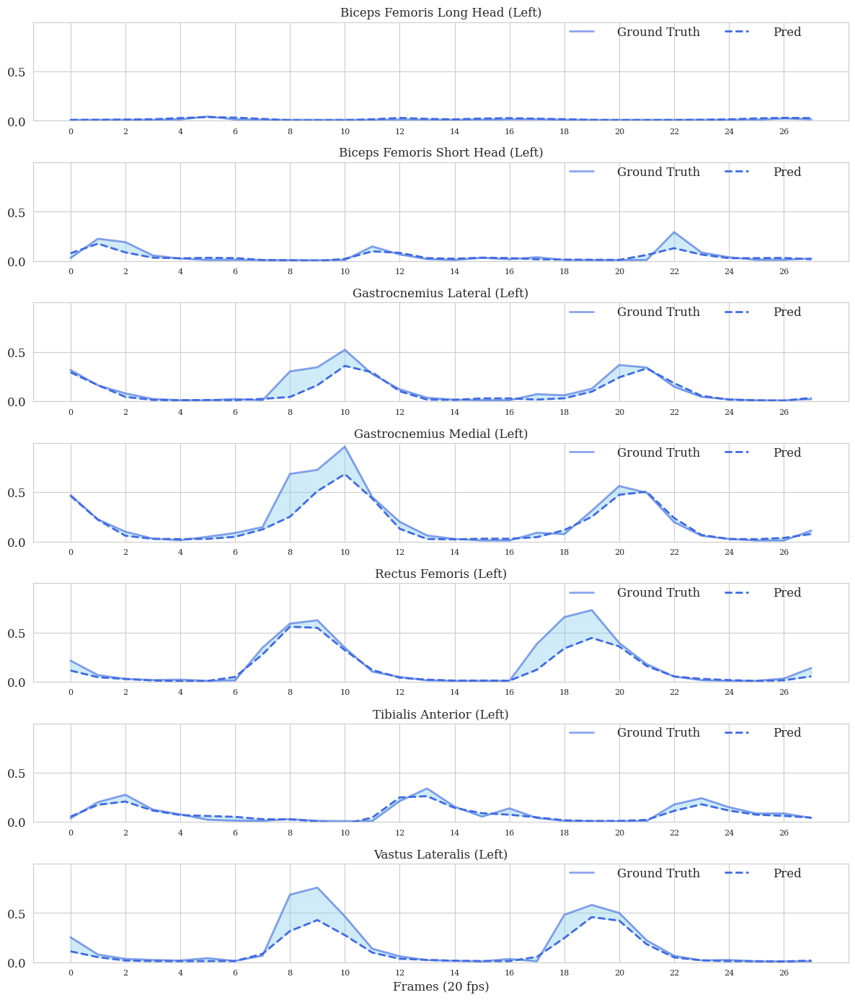

['kick']


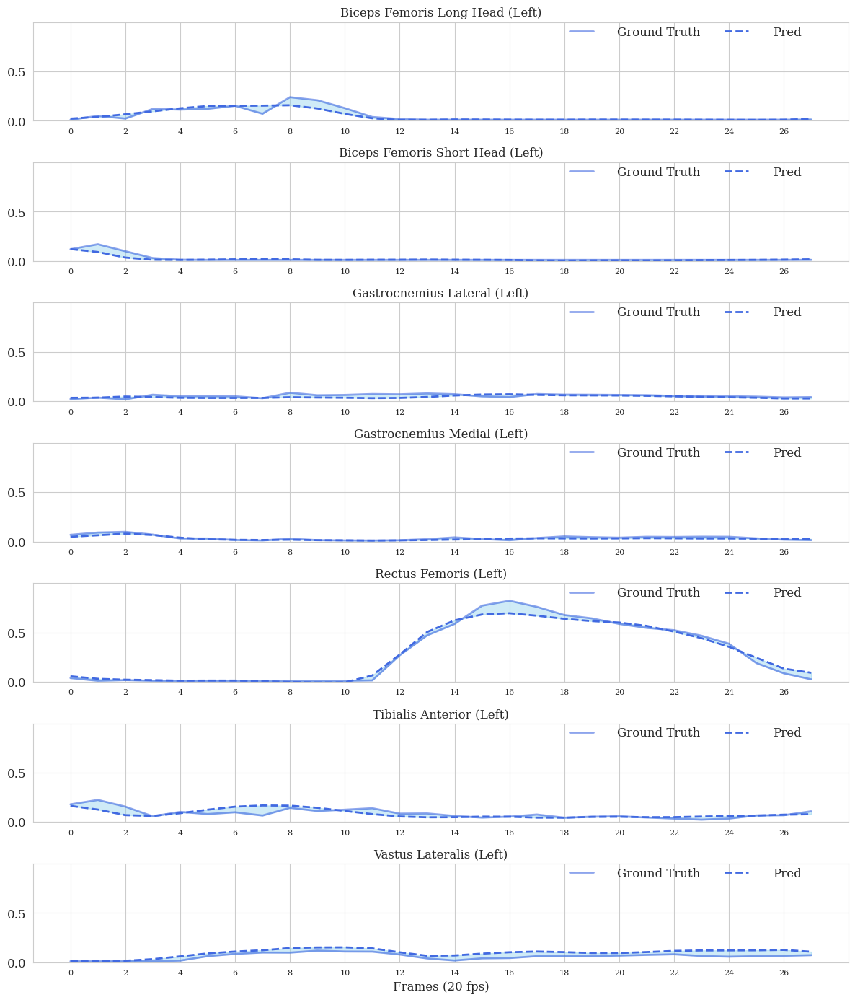

['run']


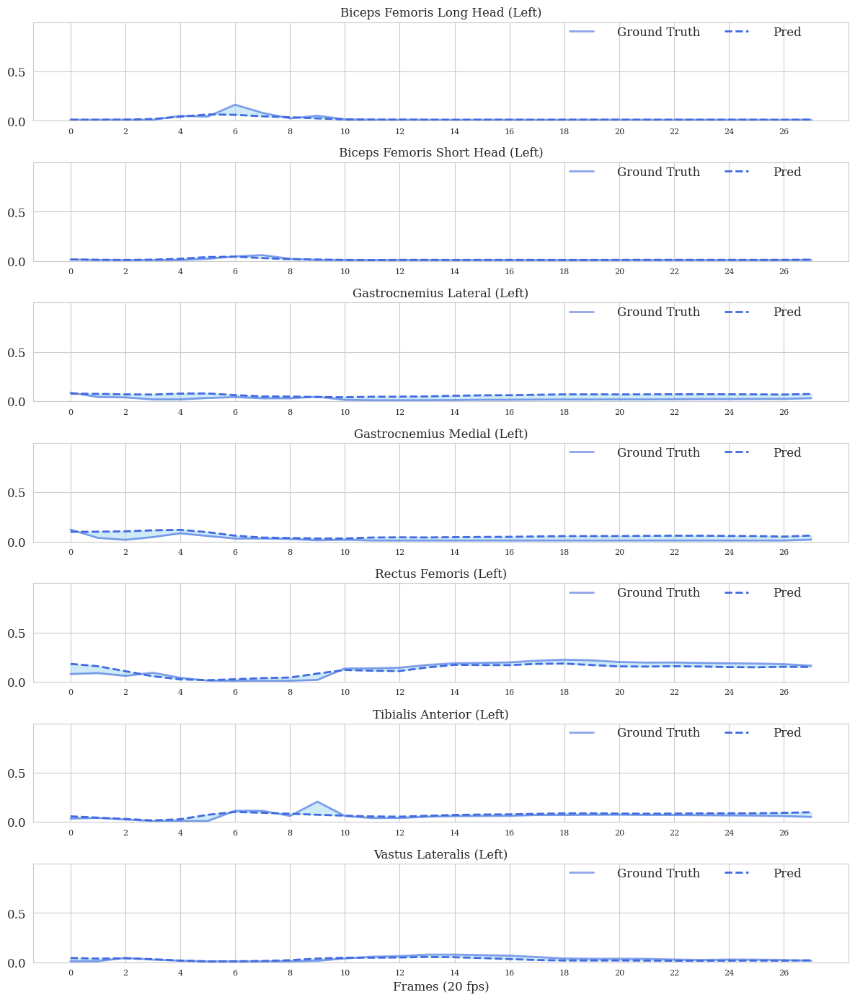

['walk']


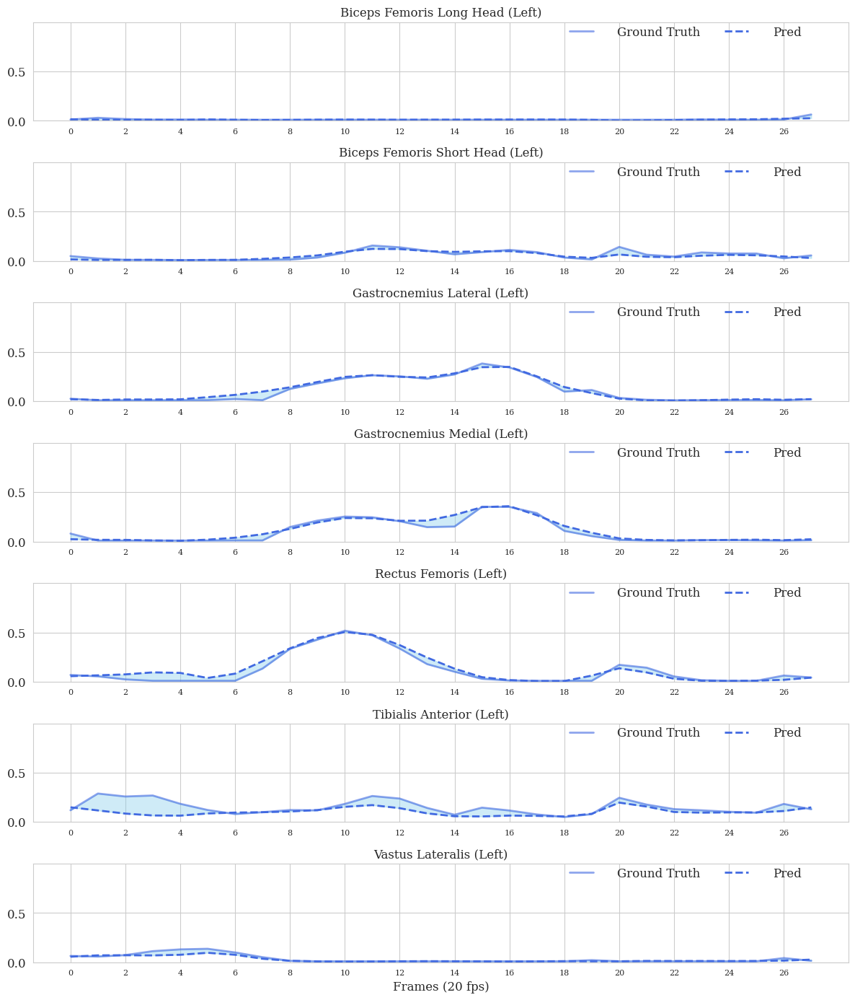

['jump']


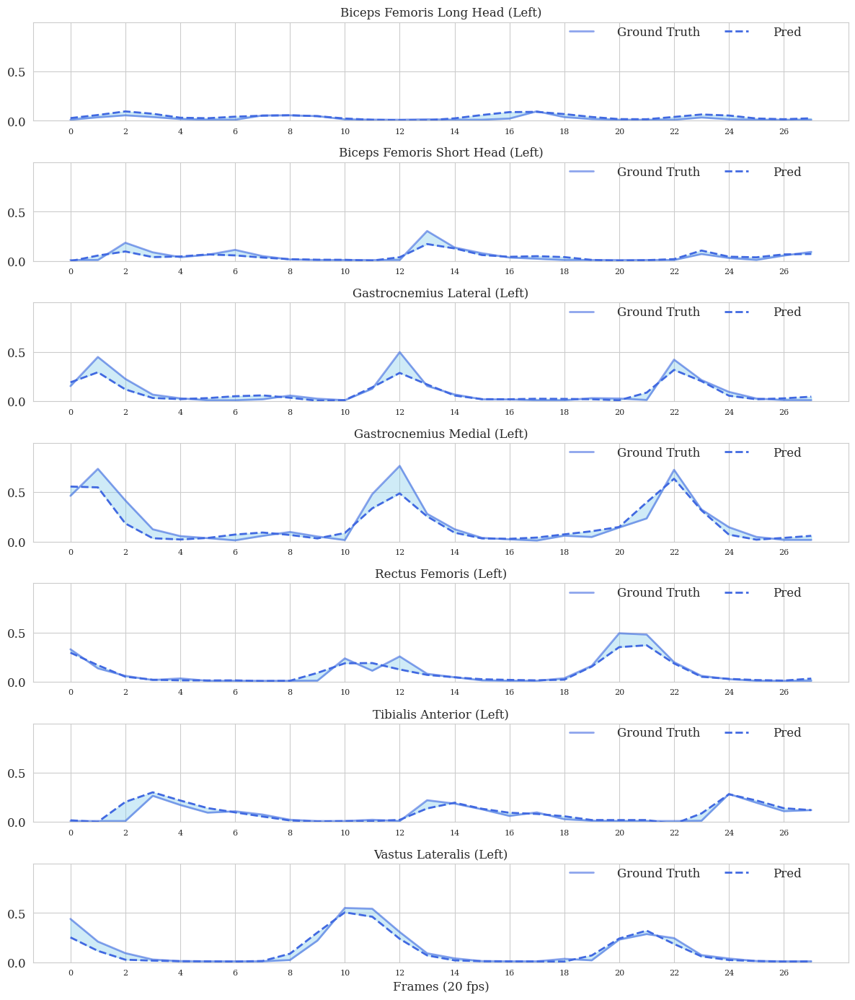

['stand']


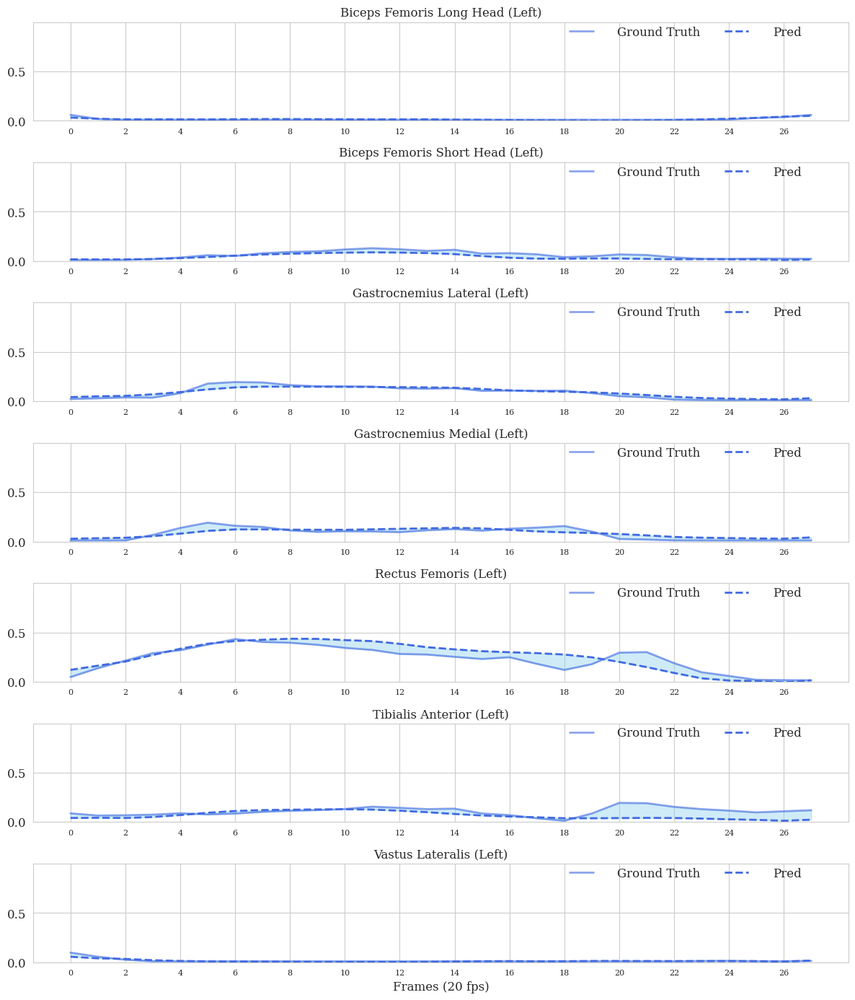

['transition', 'spin', 'walk']


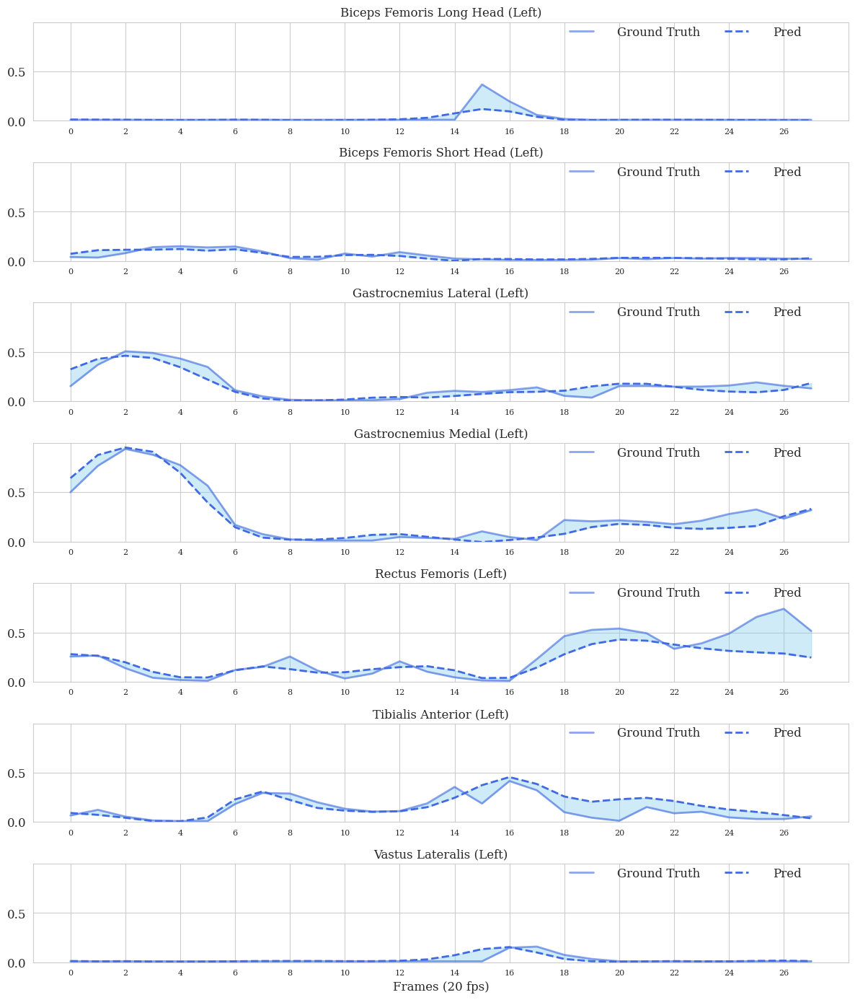

['circular movement', 'arm movements']


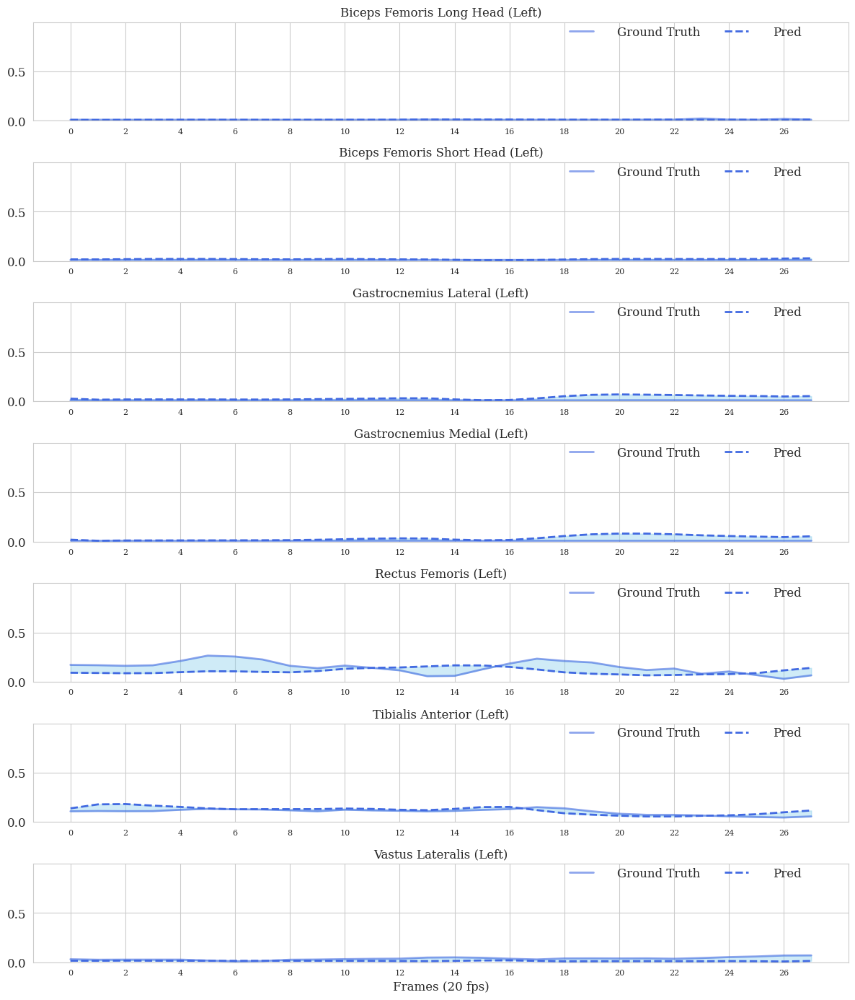

['sports move', 'action with ball', 'play catch']


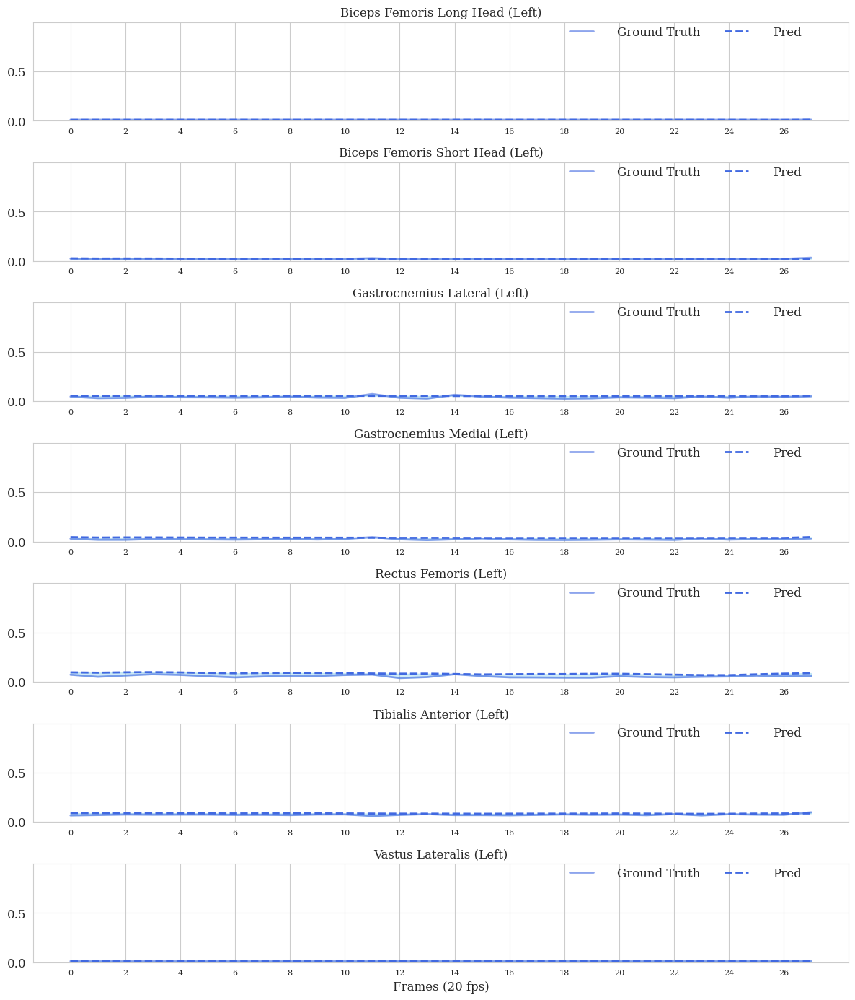

['backwards movement', 'walk']


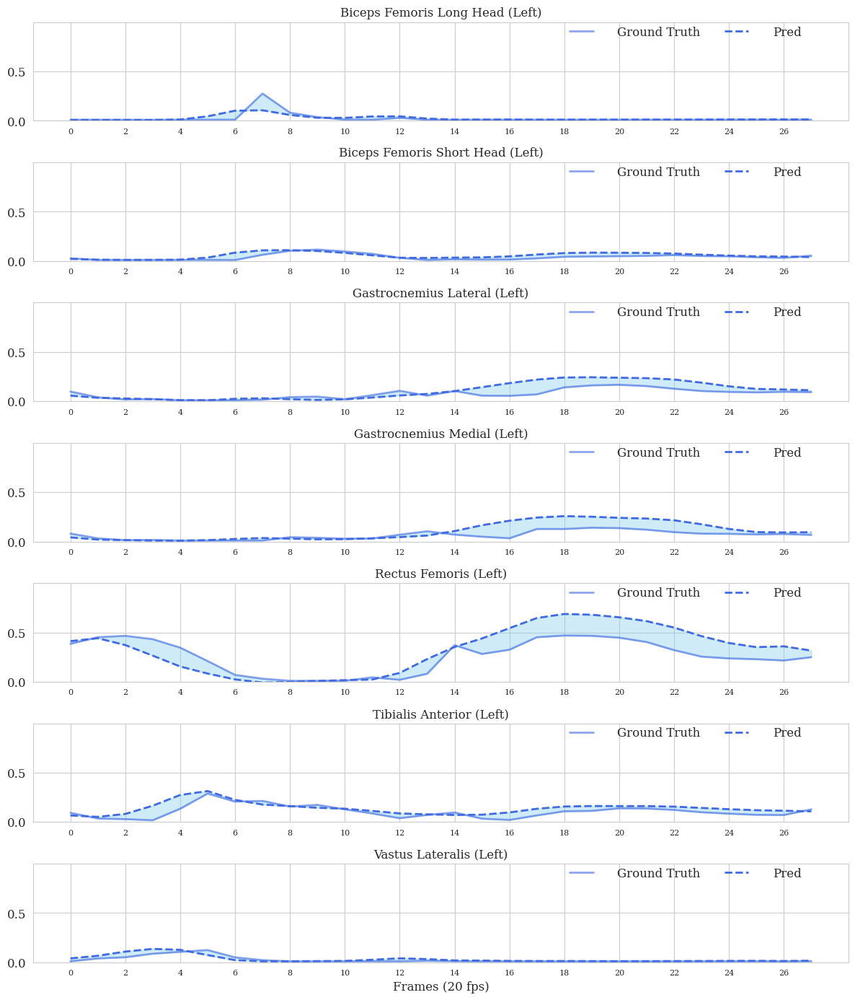

['circular movement', 'wrist movements']


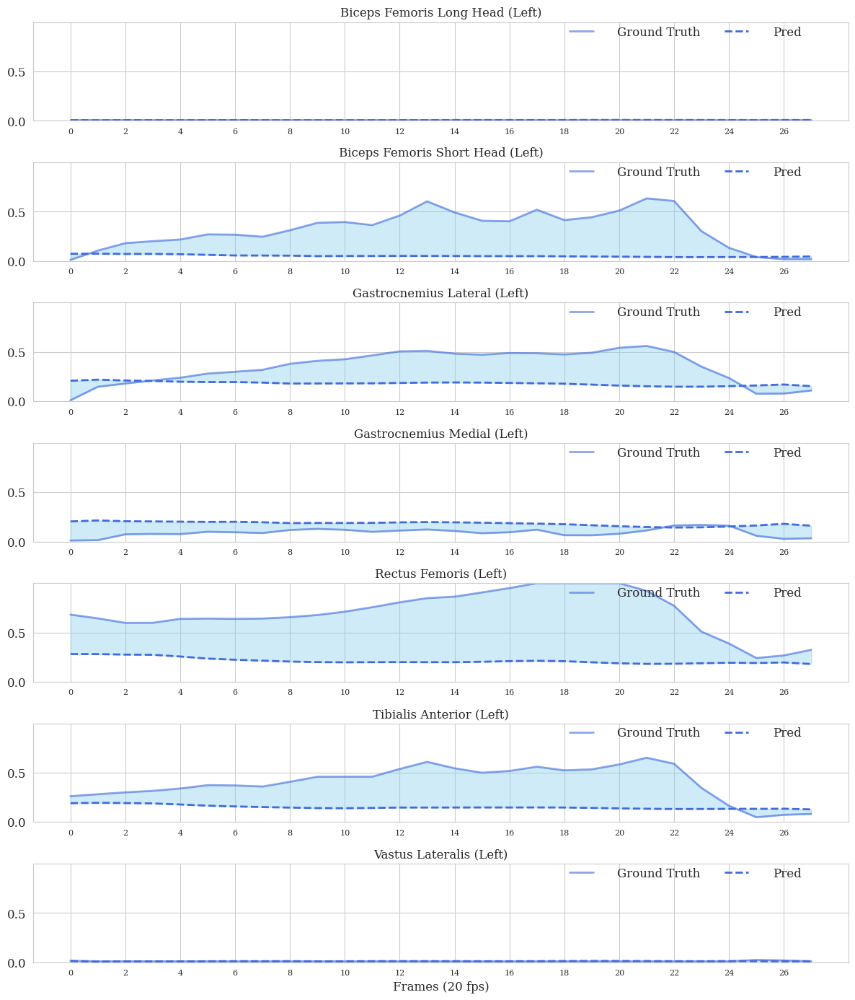

['stand']


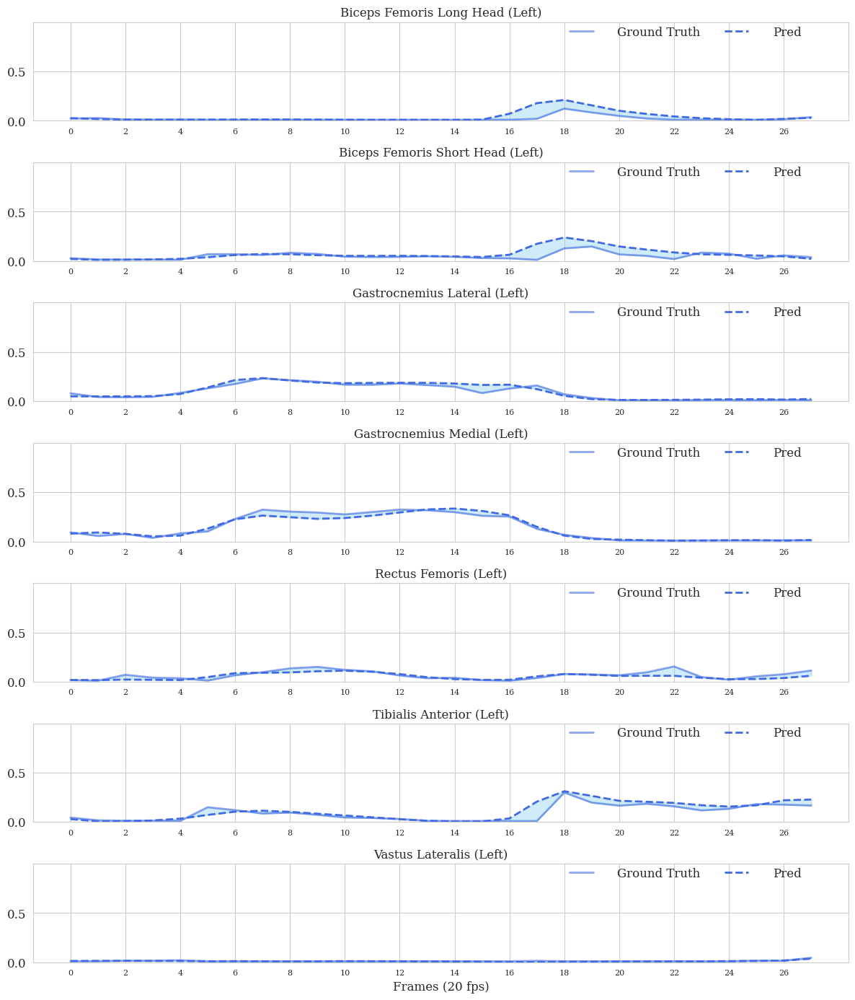

['foot movements', 'stomp']


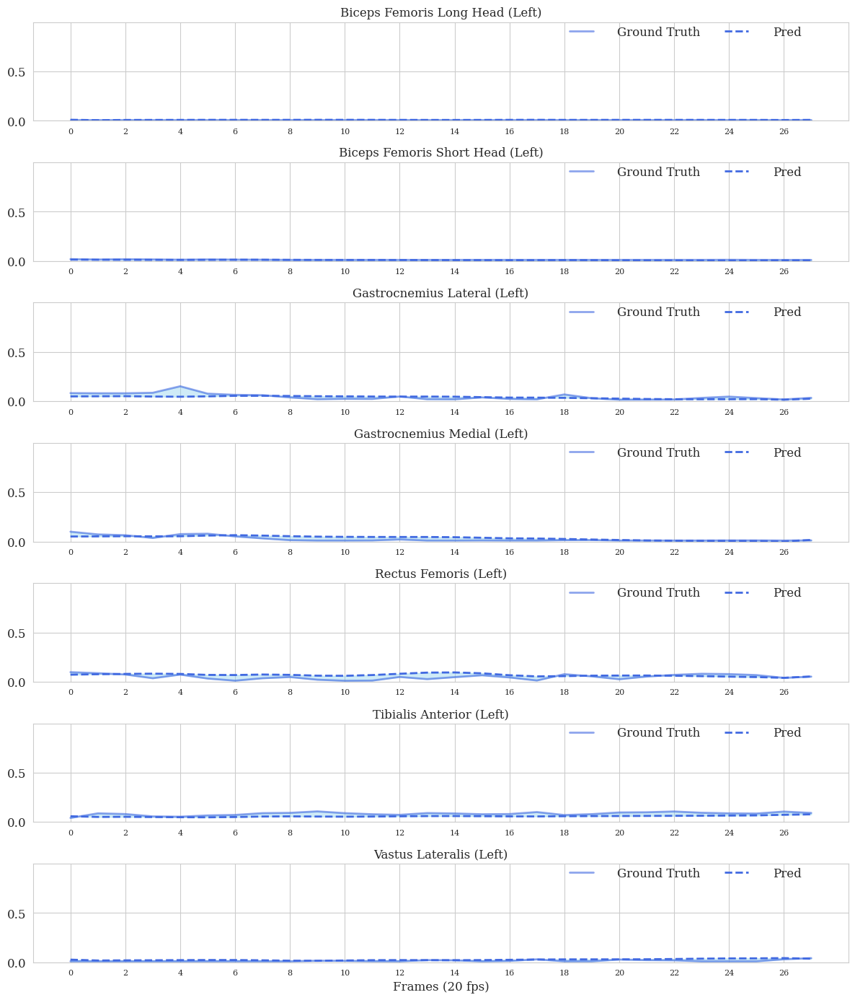

['dance', 'perform']


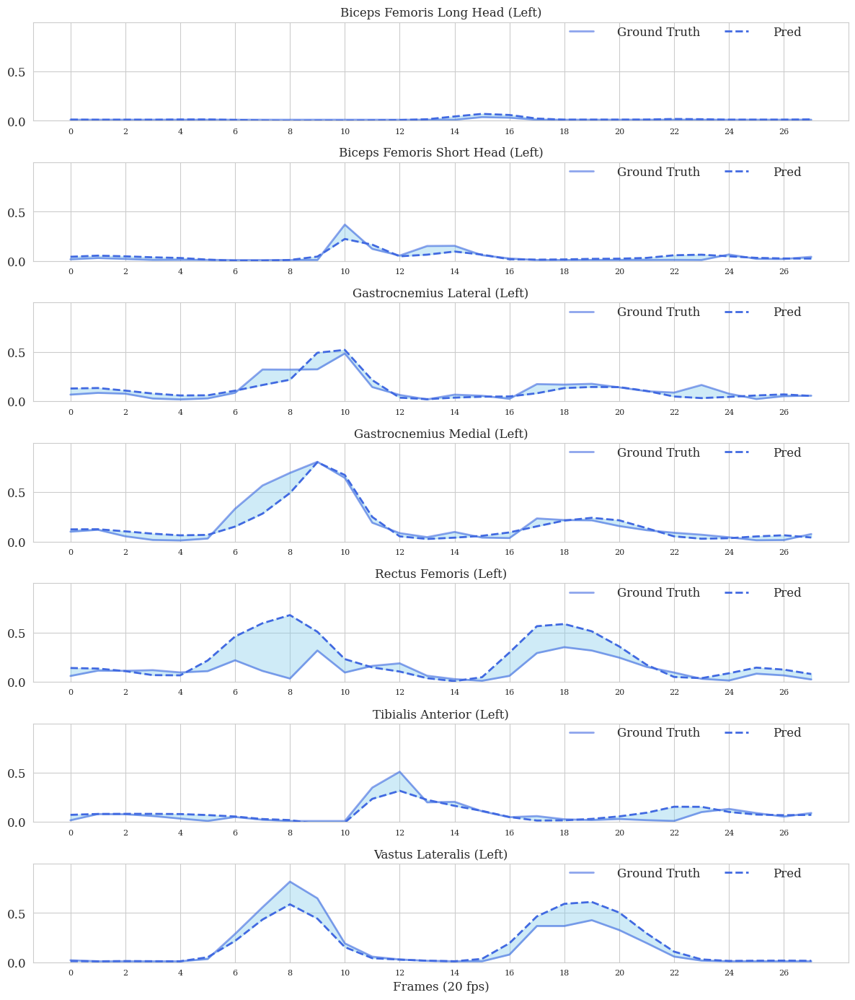

['transition', 'kick', 'leg movements', 'backwards movement']


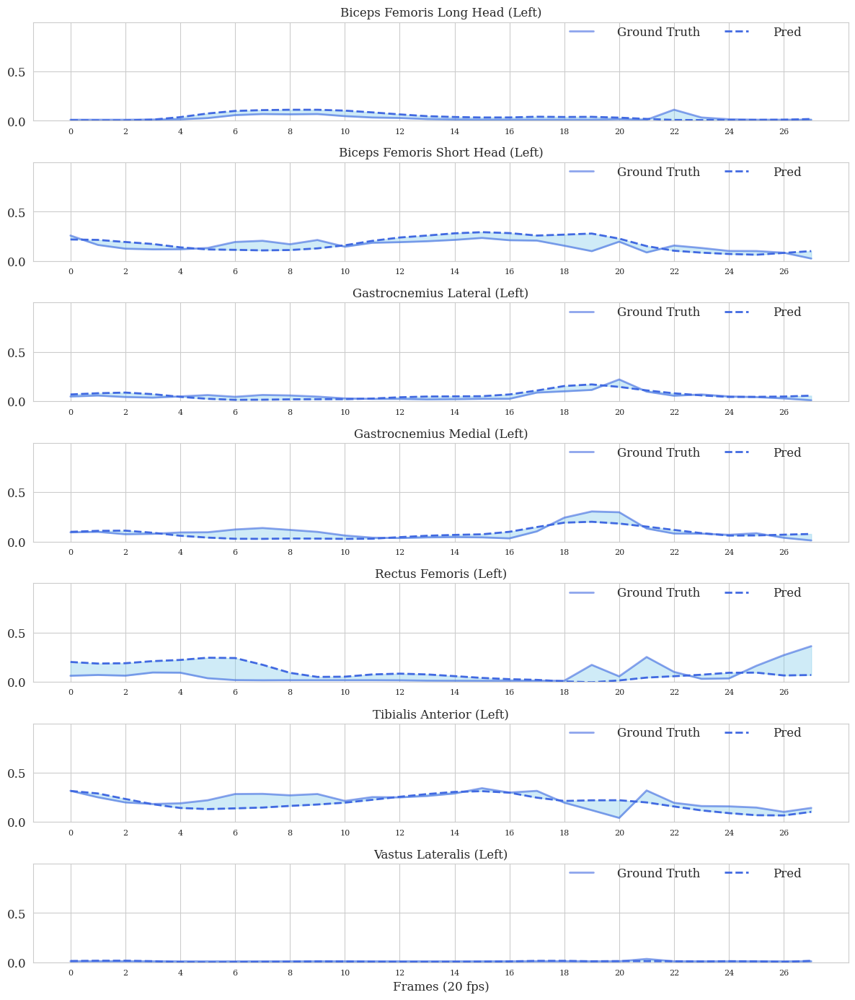

['walk']


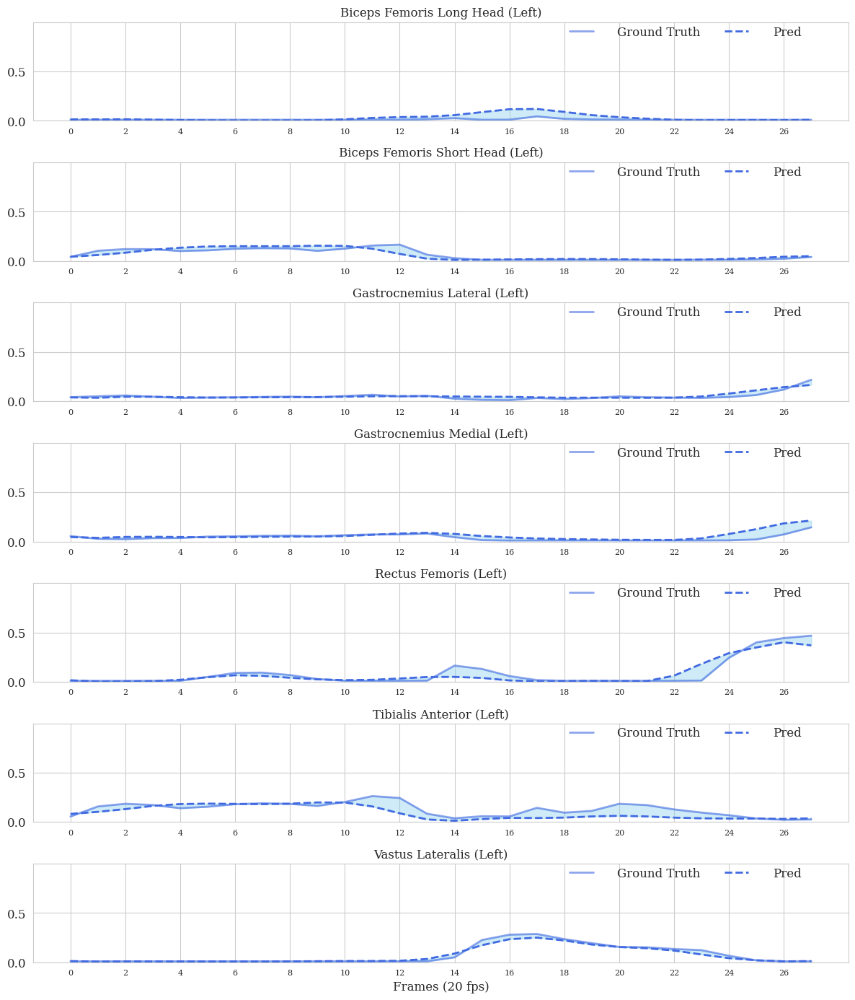

['dance', 'perform']


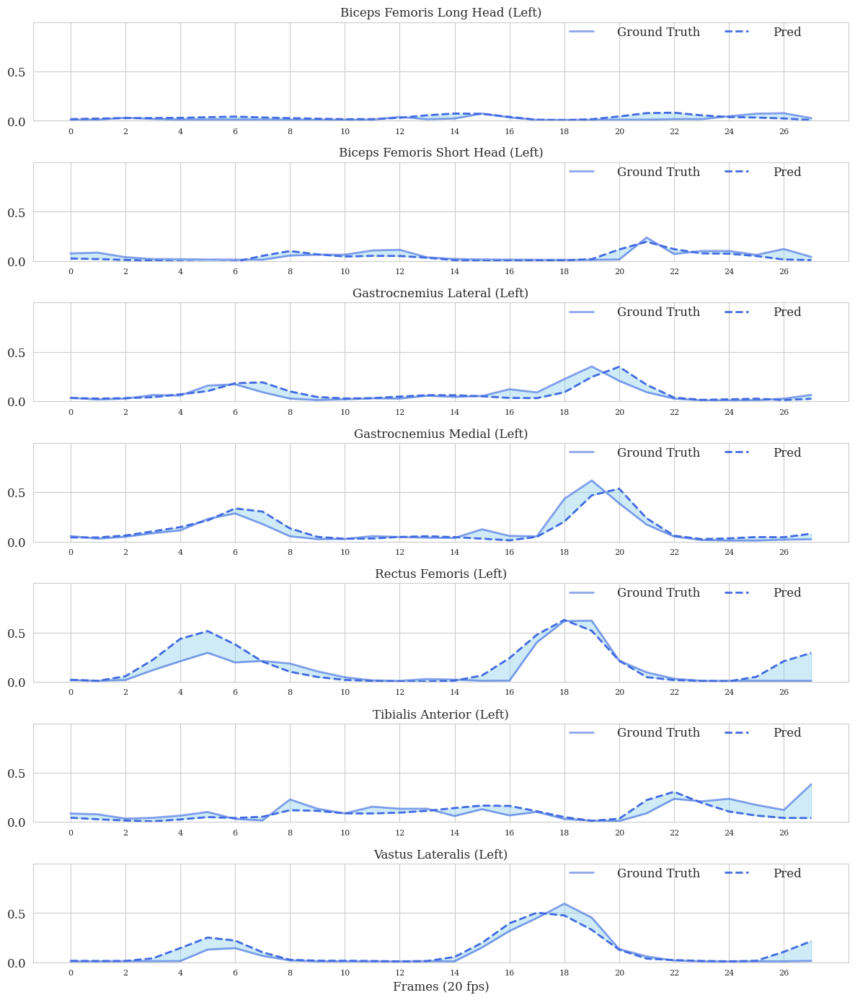

['jump']


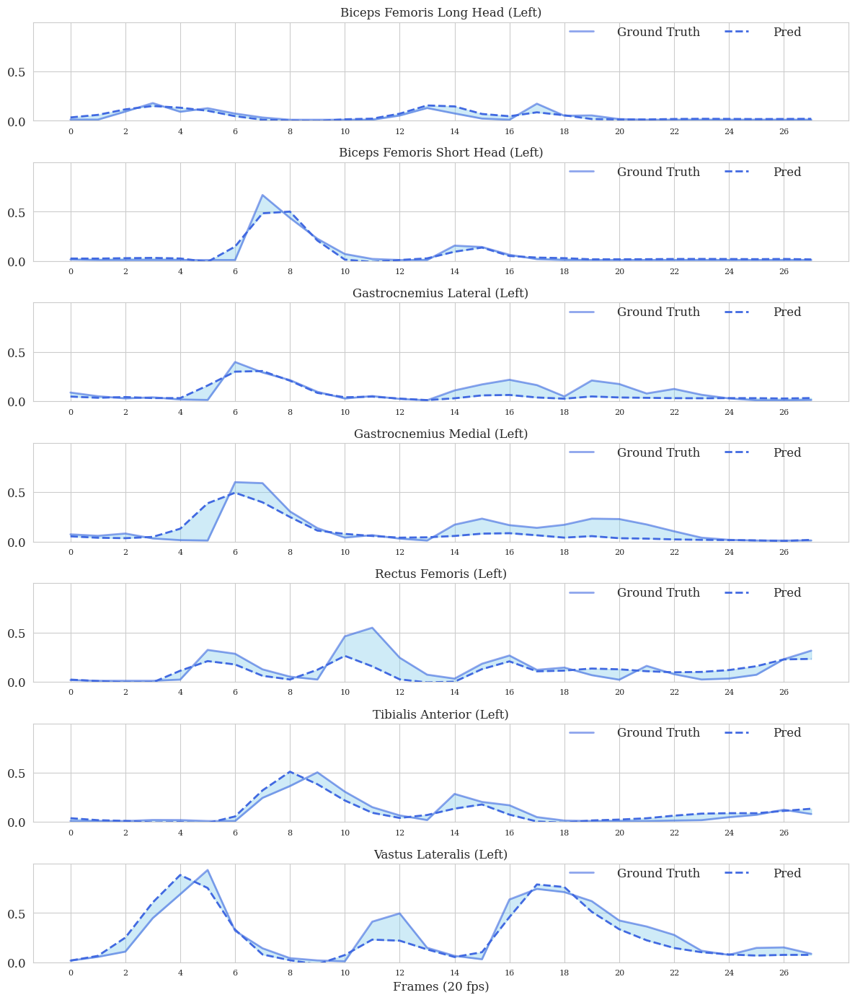

['transition', 'stand']


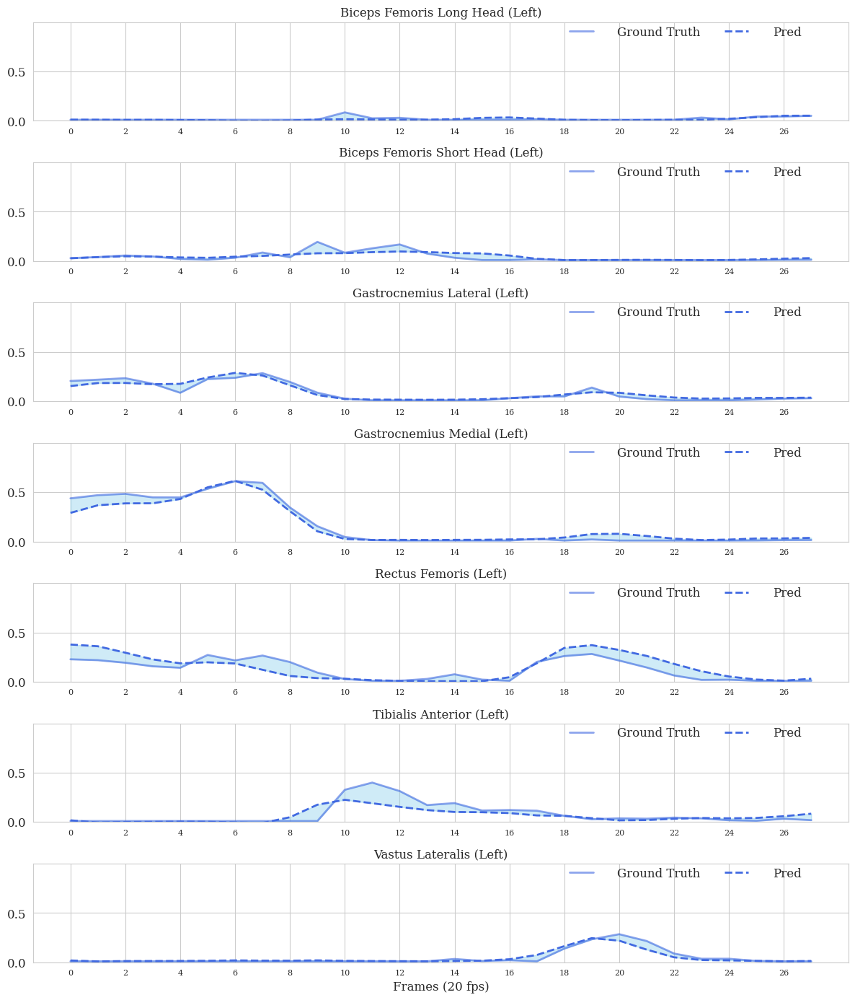

['step', 'sideways movement']


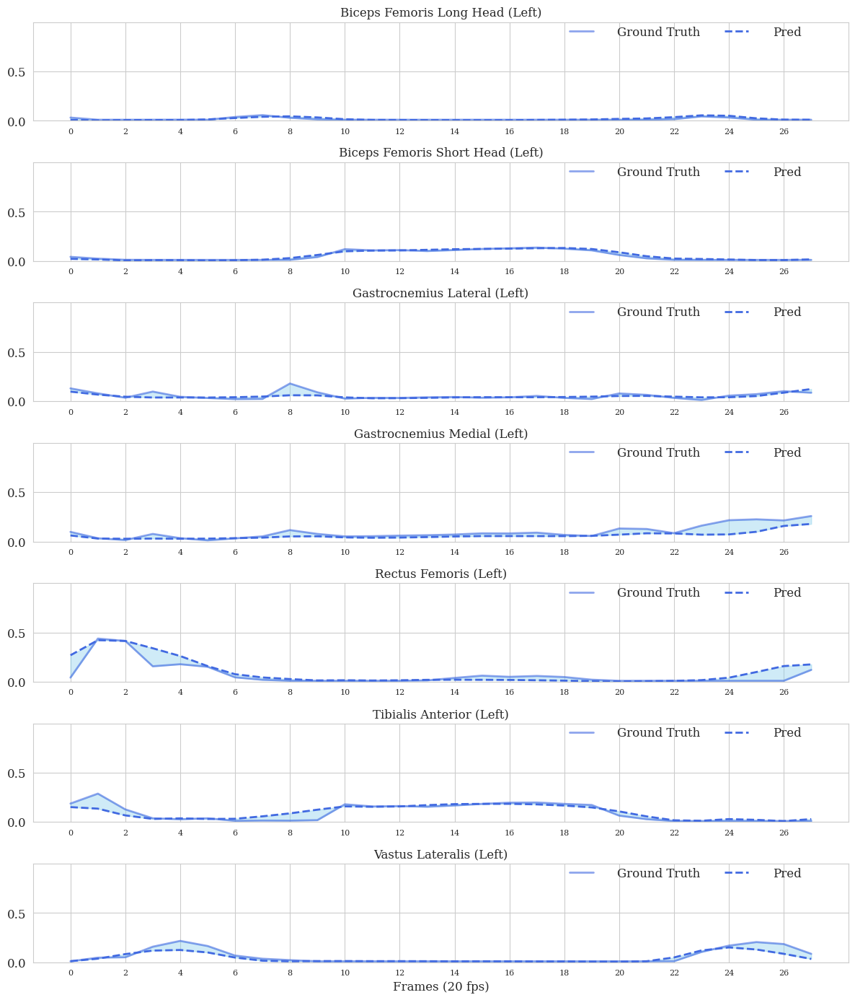

['run']


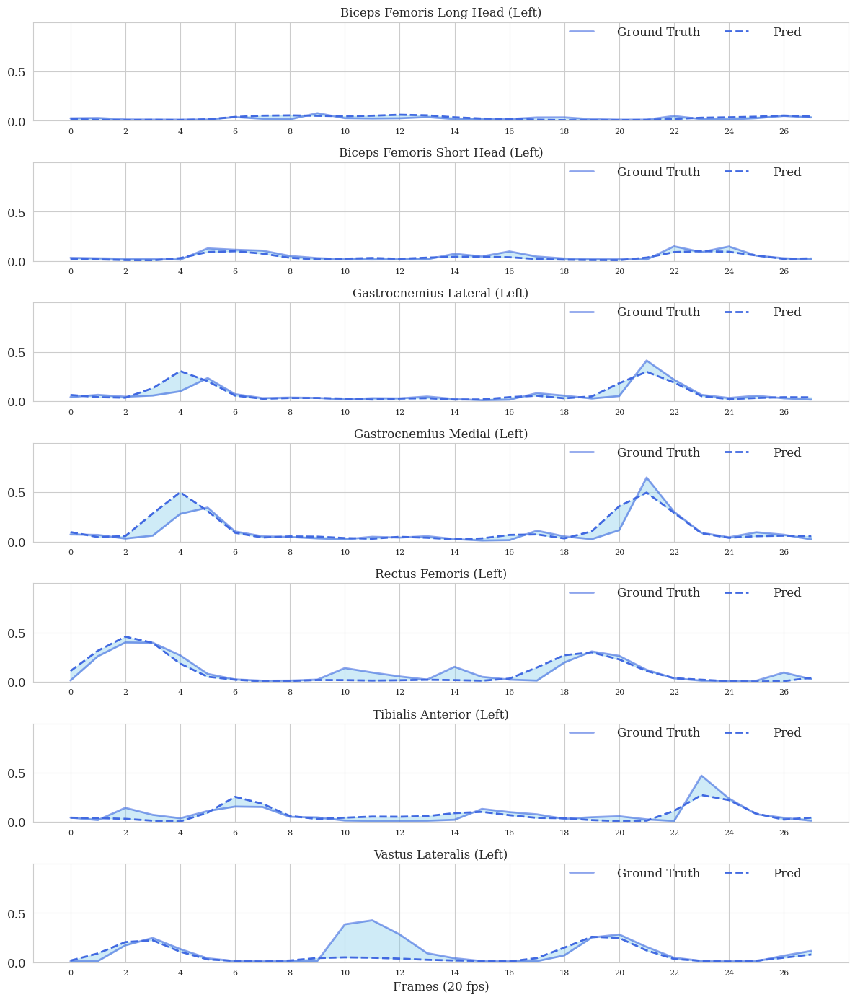

['arm movements', 'crossing limbs']


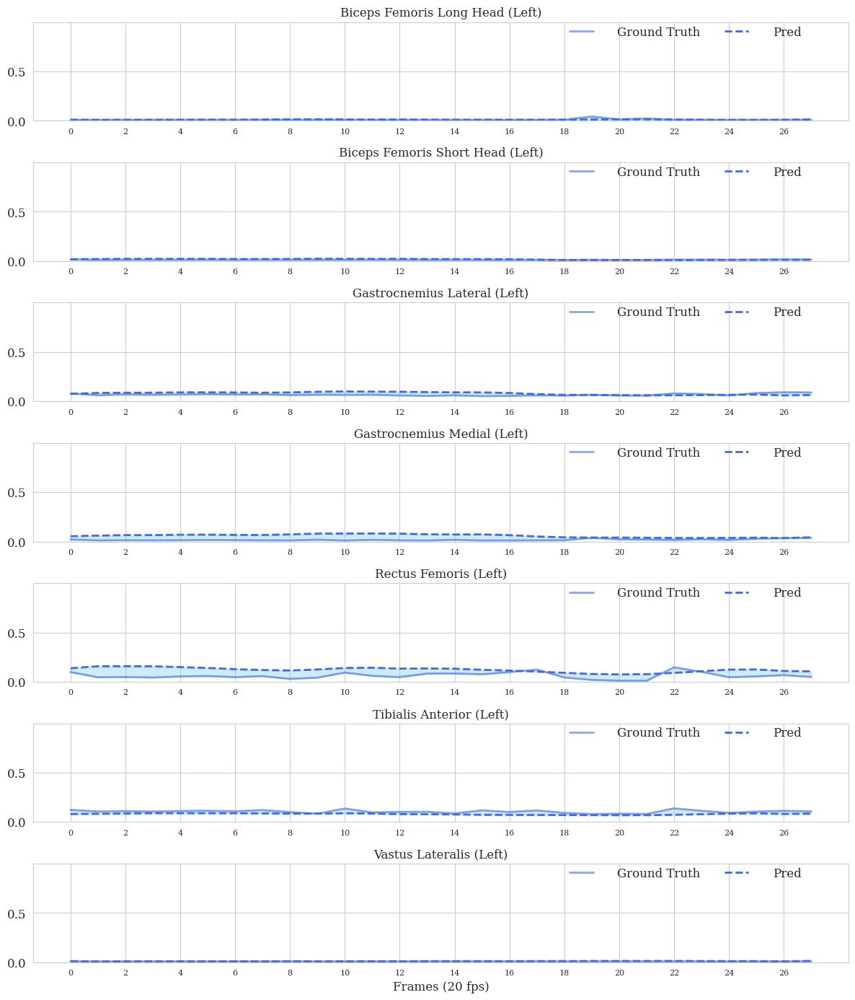

['circular movement', 'wrist movements']


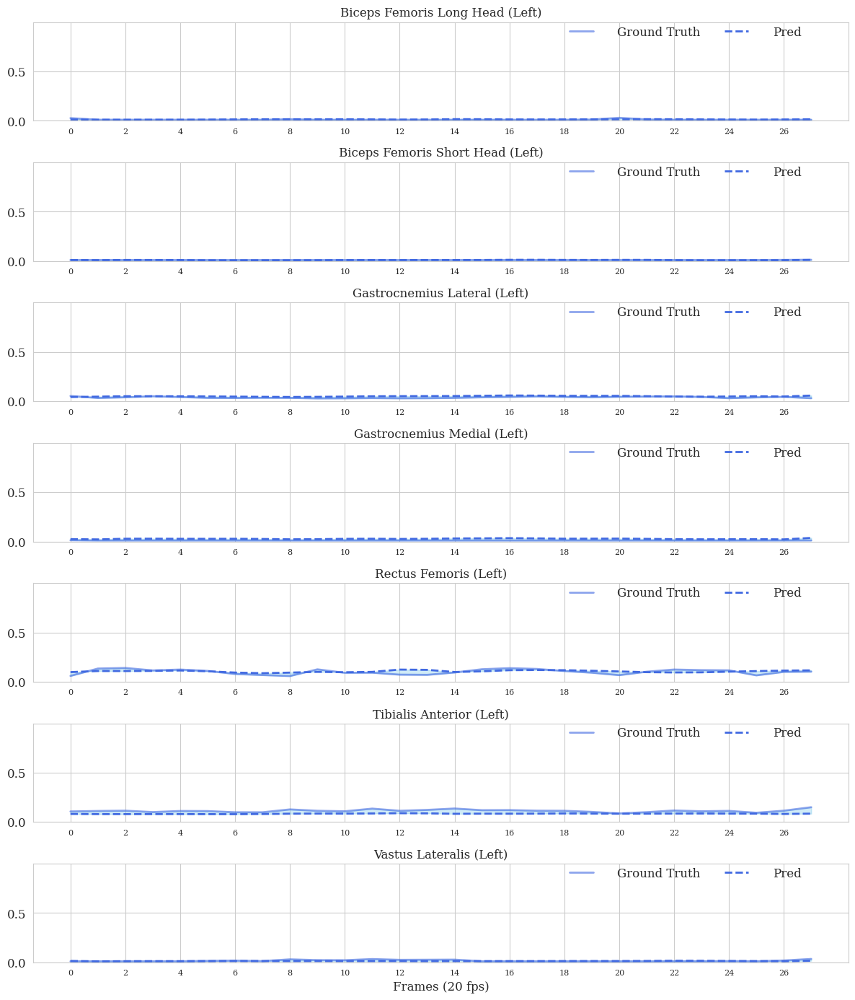

['to lower a body part', 'hand movements', 'turn', 'stand']


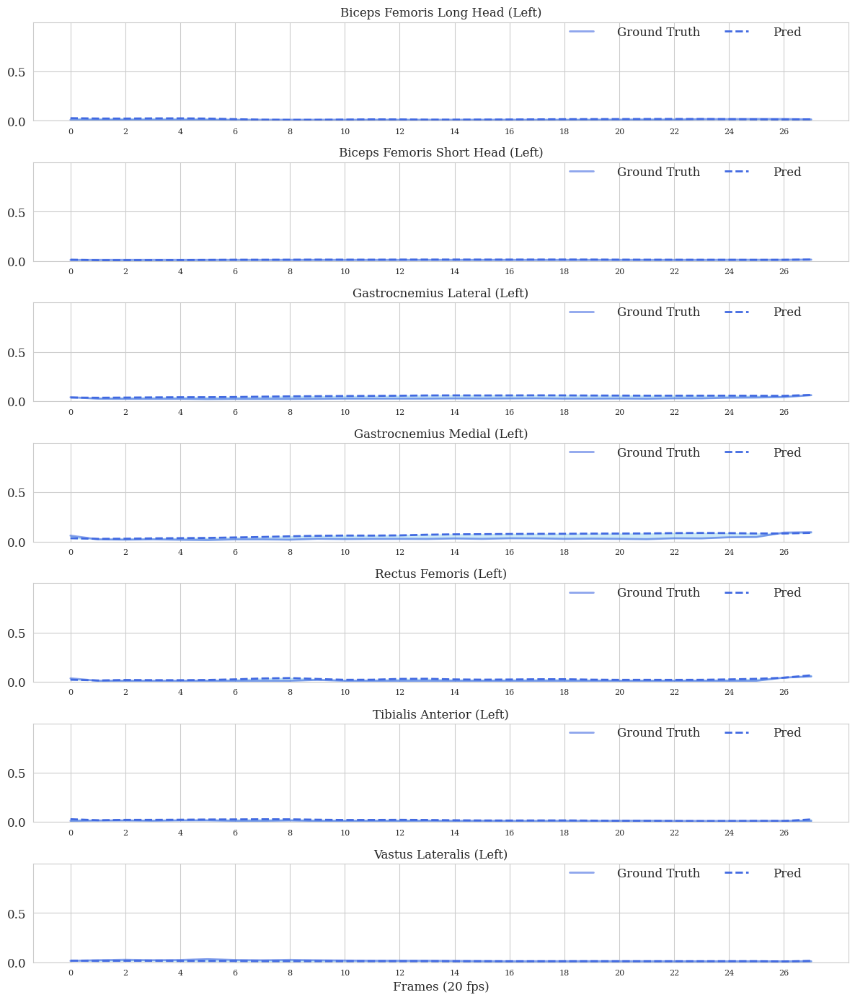

['transition', 'arm movements', 'crossing limbs']


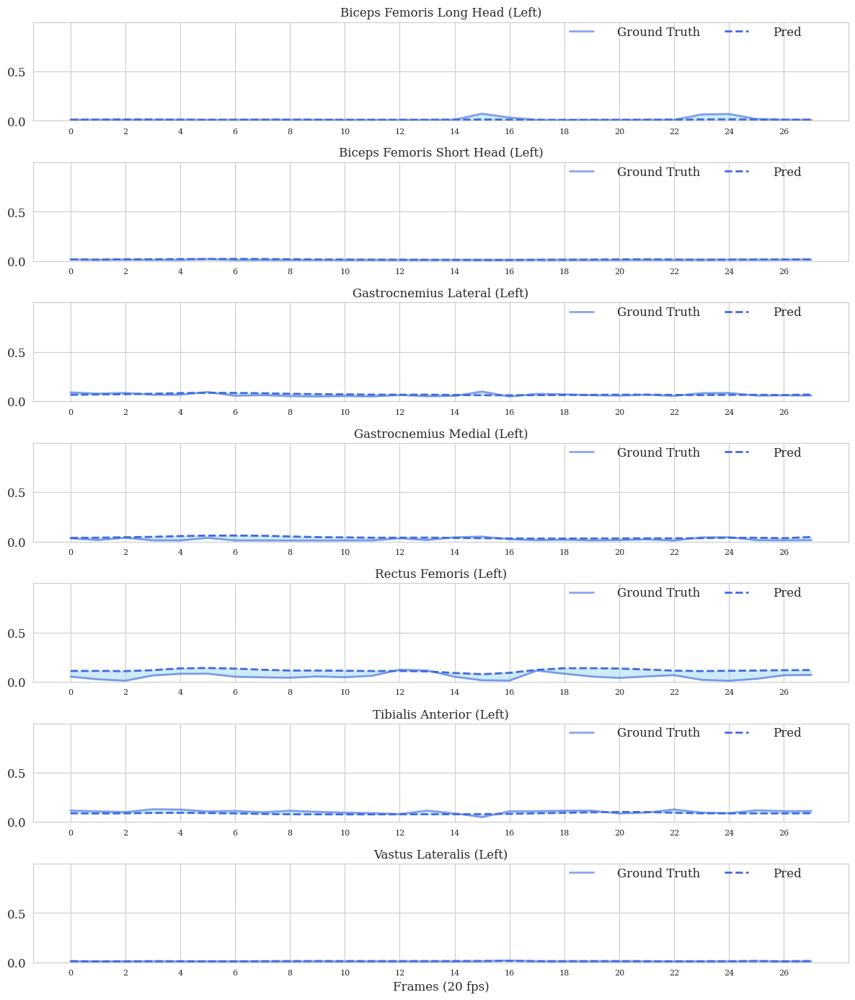

['foot movements', 'walk', 'transition', 'stand', 'spin']


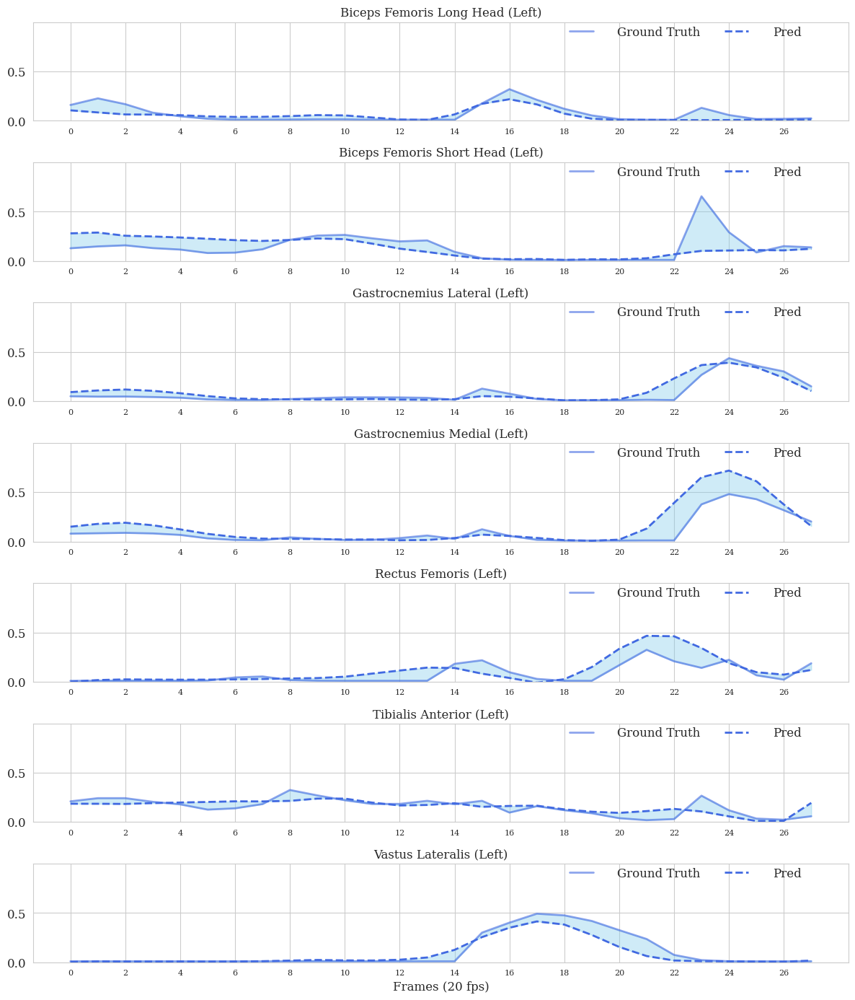

['sports move', 'action with ball', 'play catch']


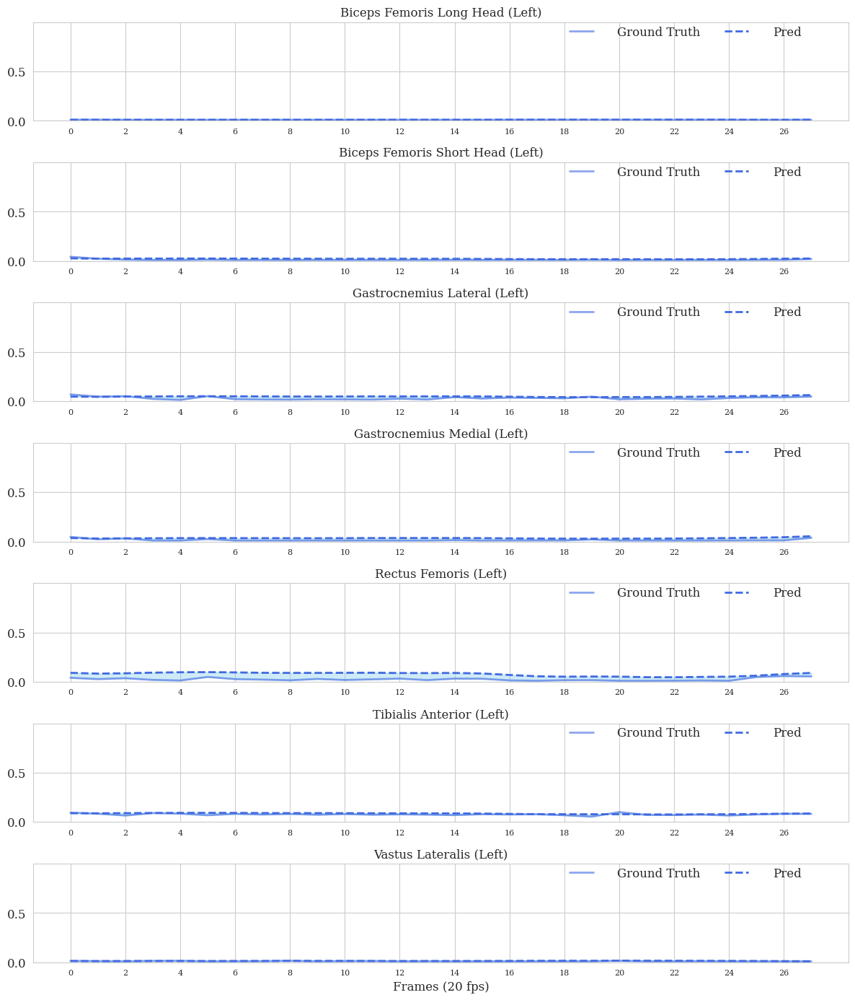

['drink']


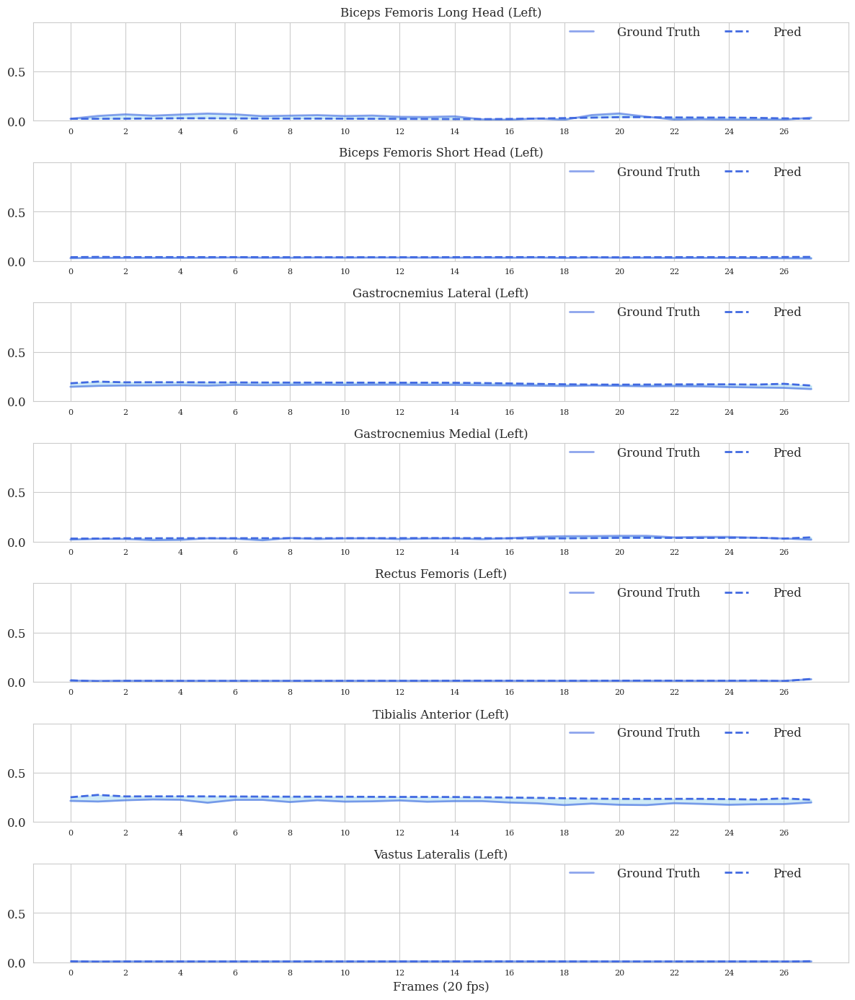

['place something']


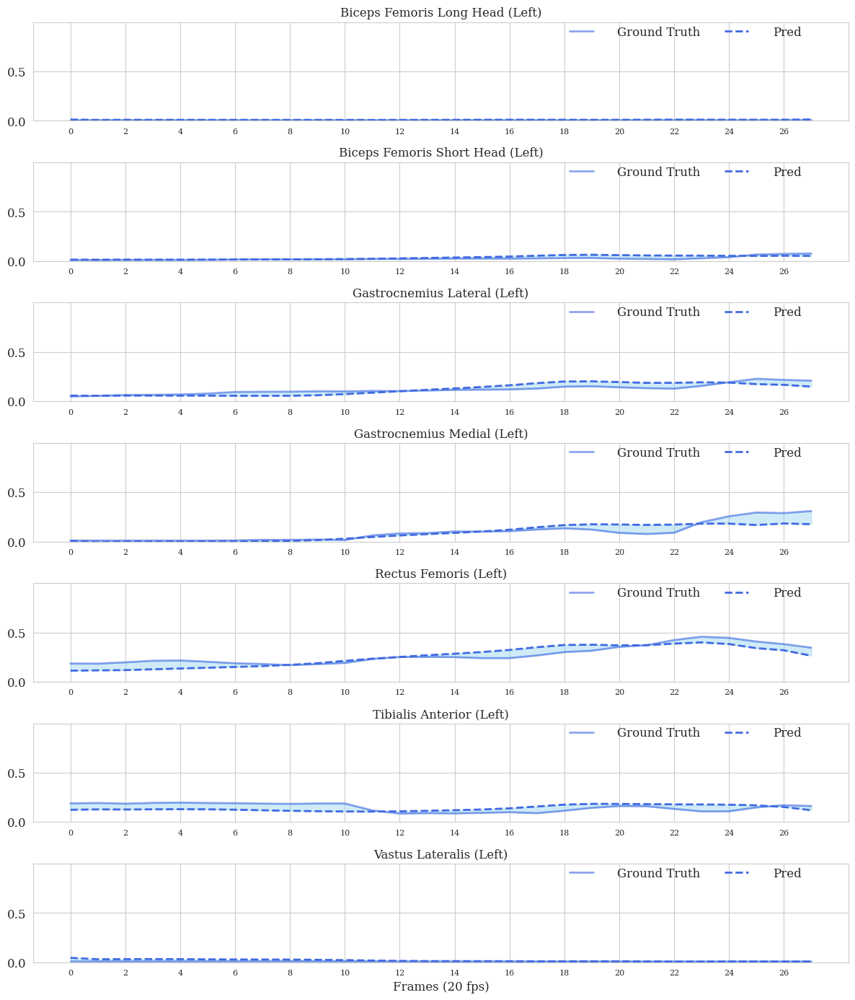

['transition', 'turn', 'walk']


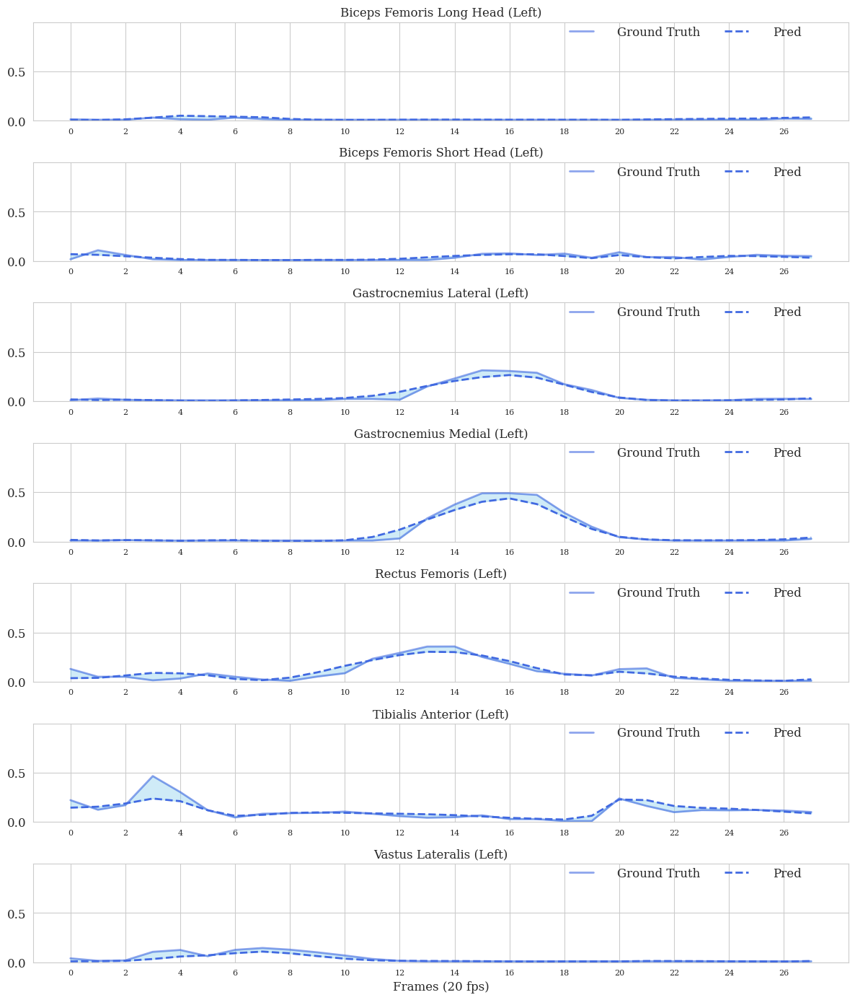

['stand']


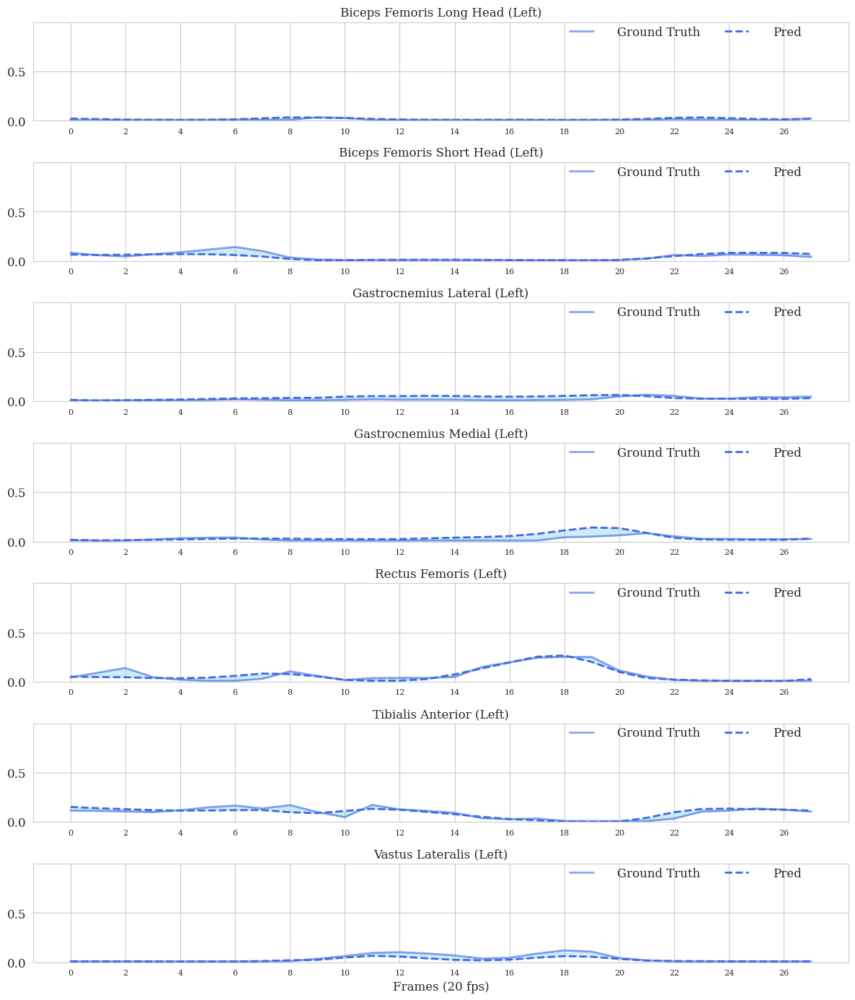

['walk']


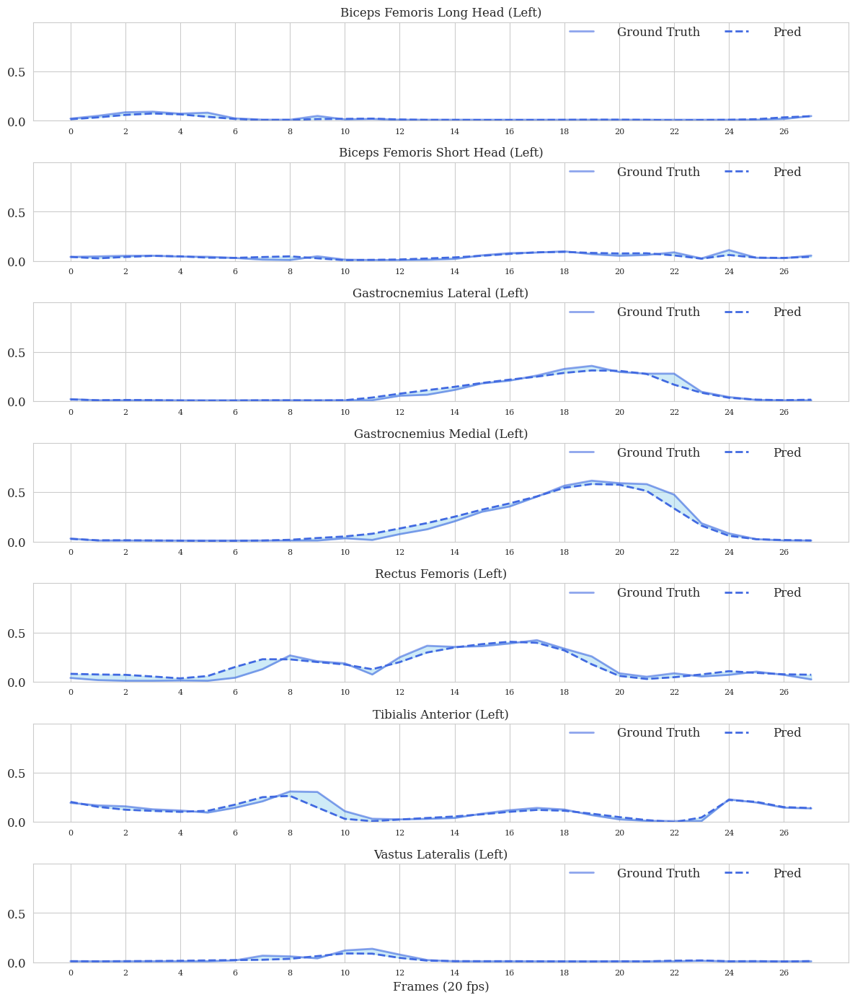

['walk', 'turn']


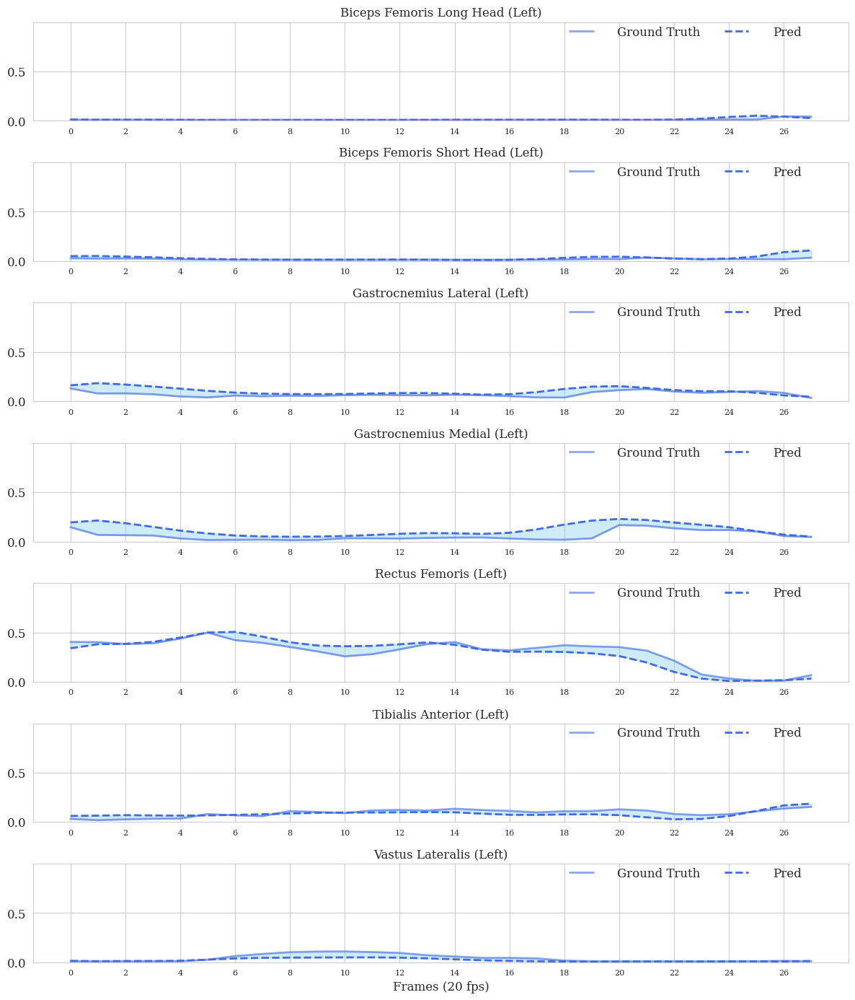

['walk']


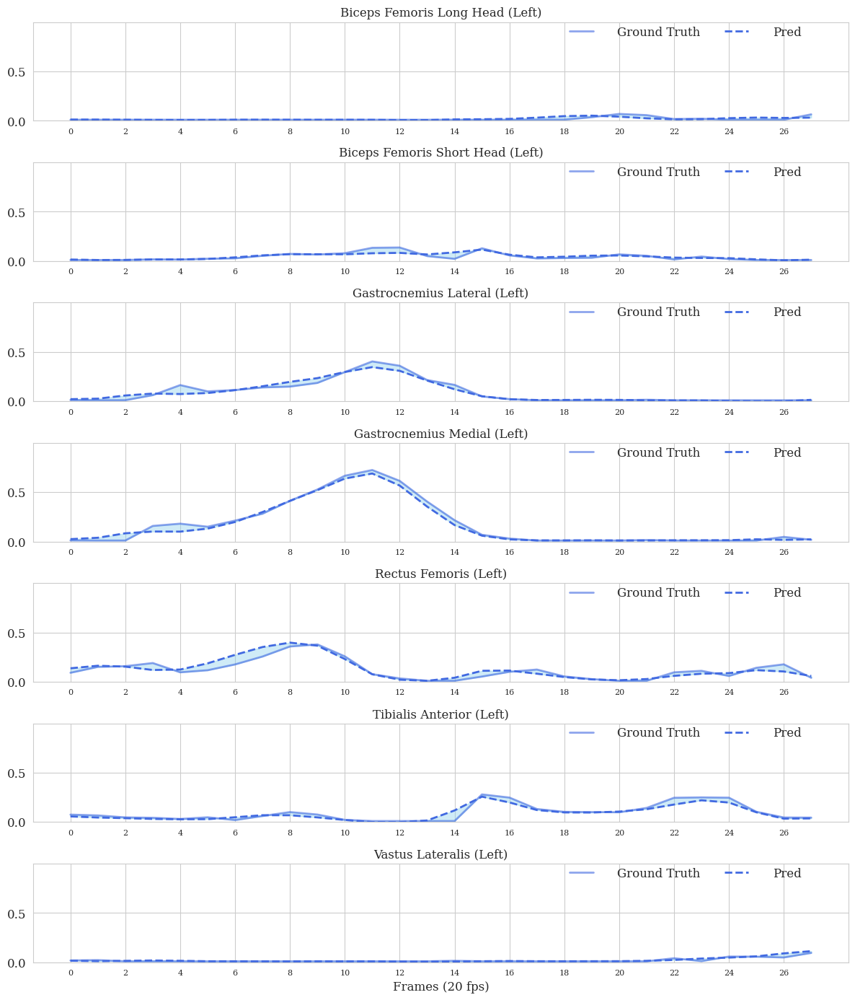

['walk', 'turn']


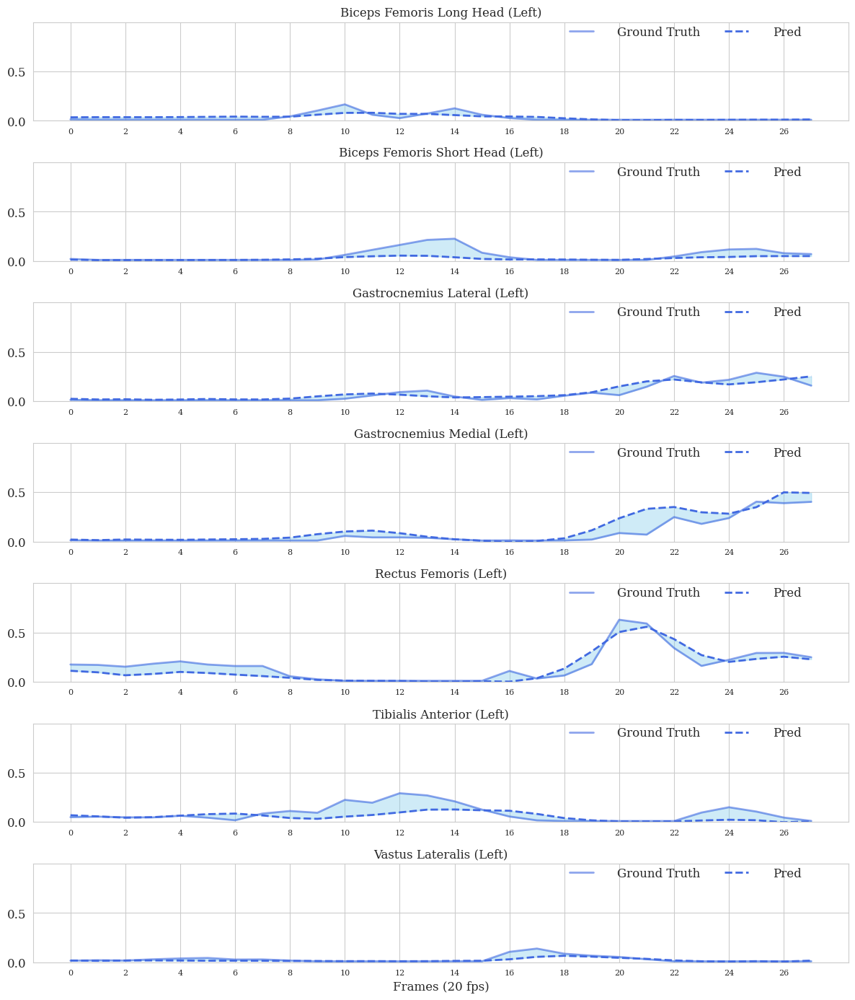

['walk']


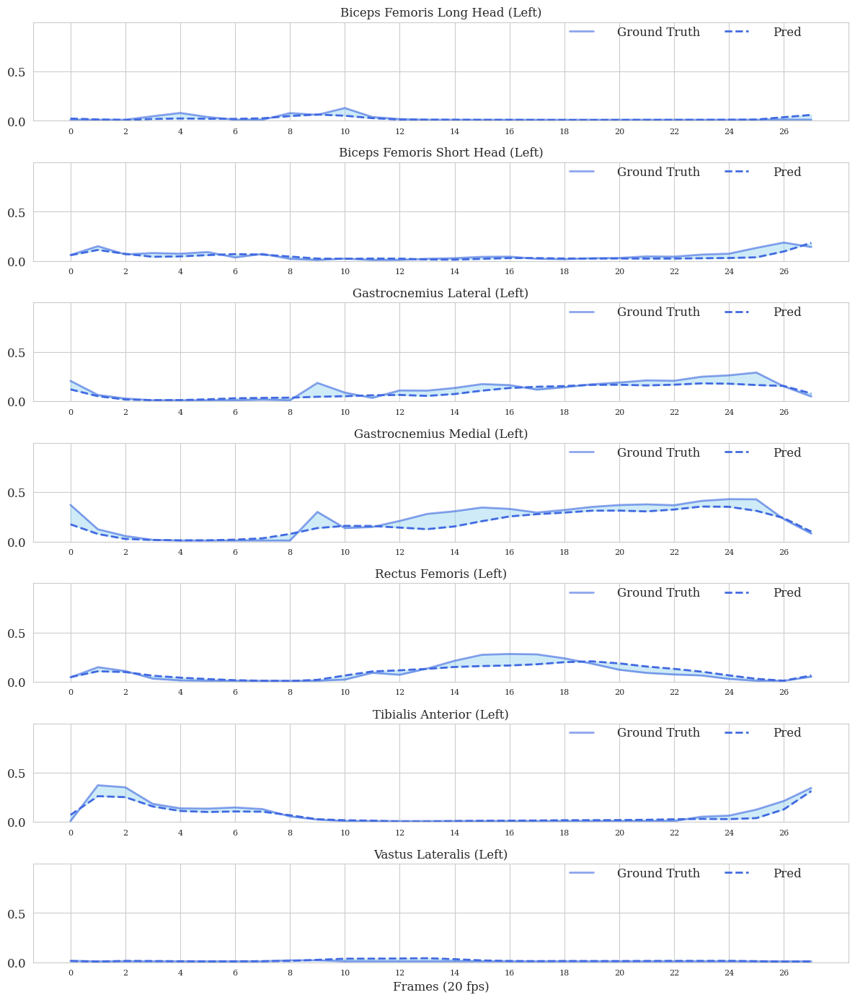

['transition', 'take/pick something up']


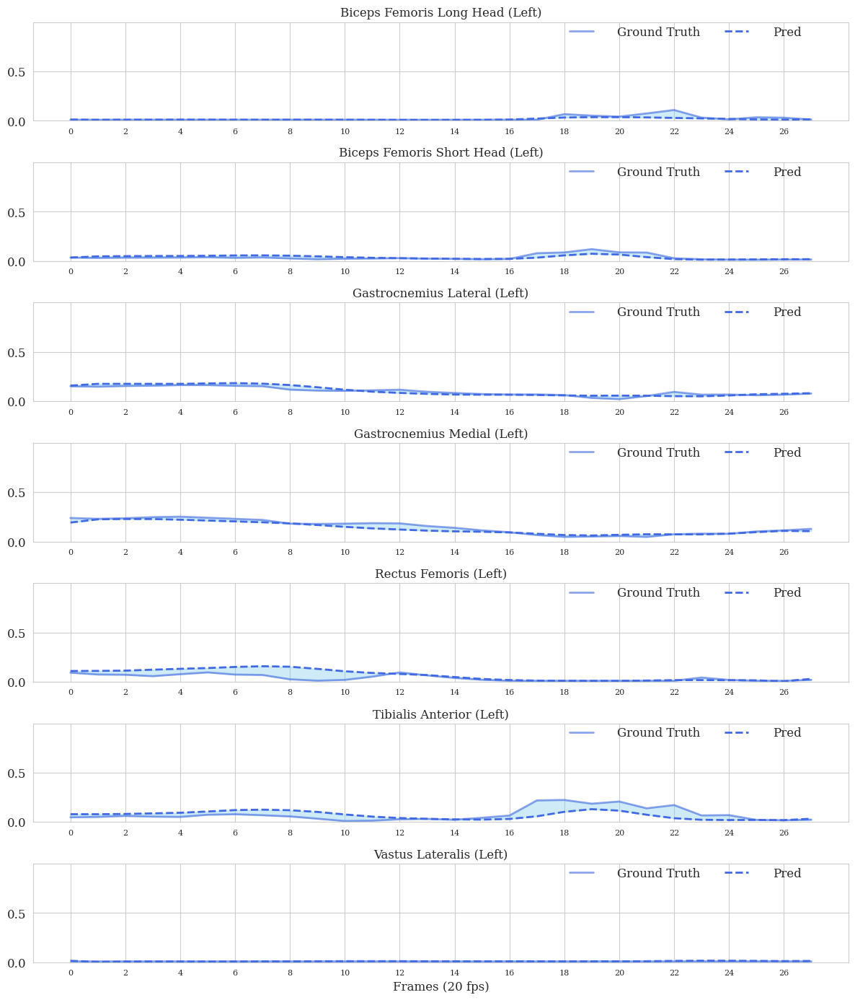

['interact with/use object']


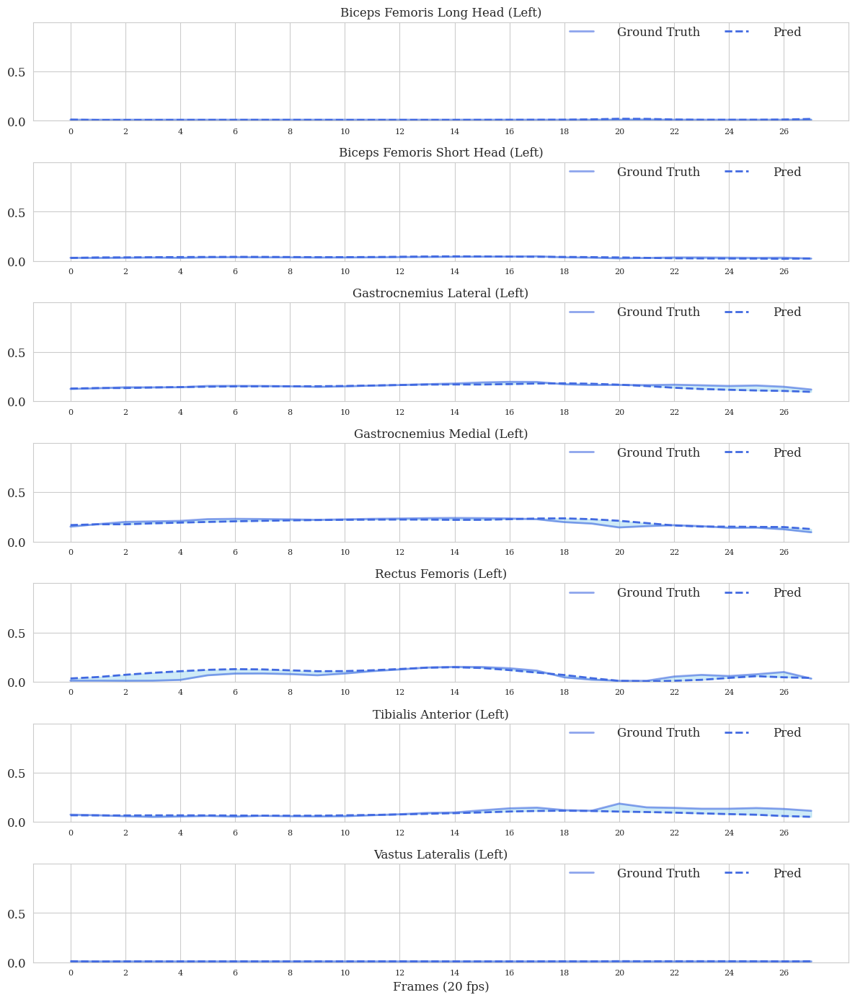

['walk']


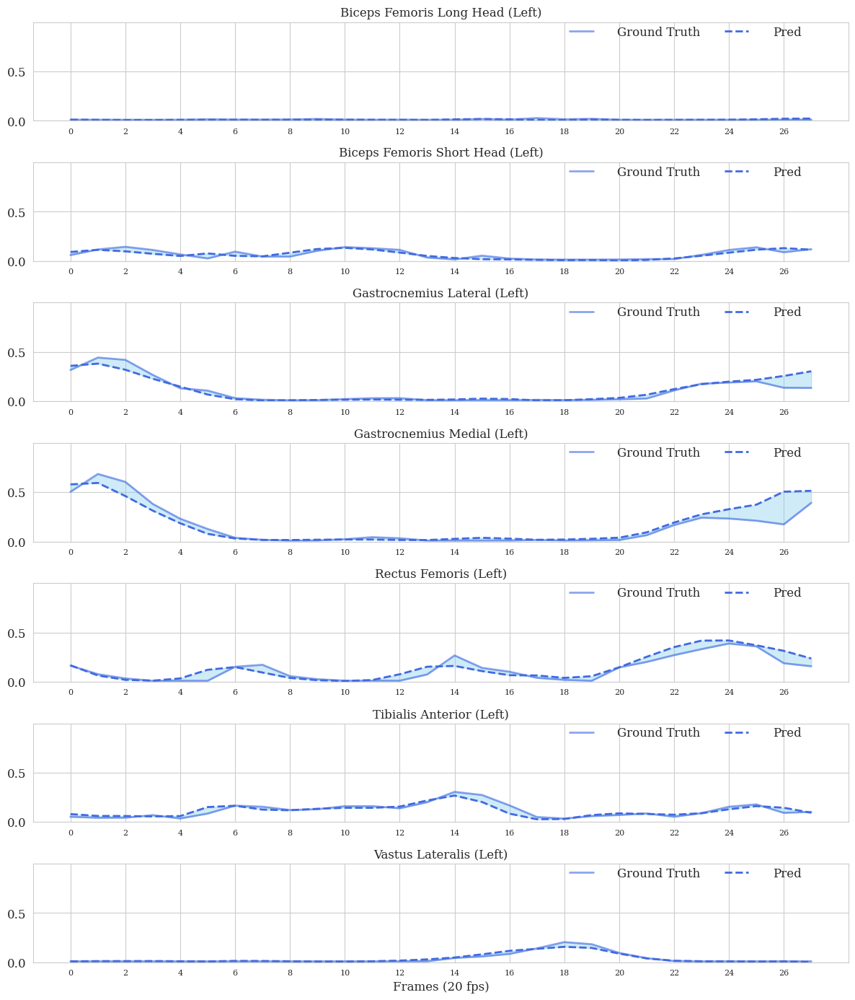

['swing body part', 'arm movements']


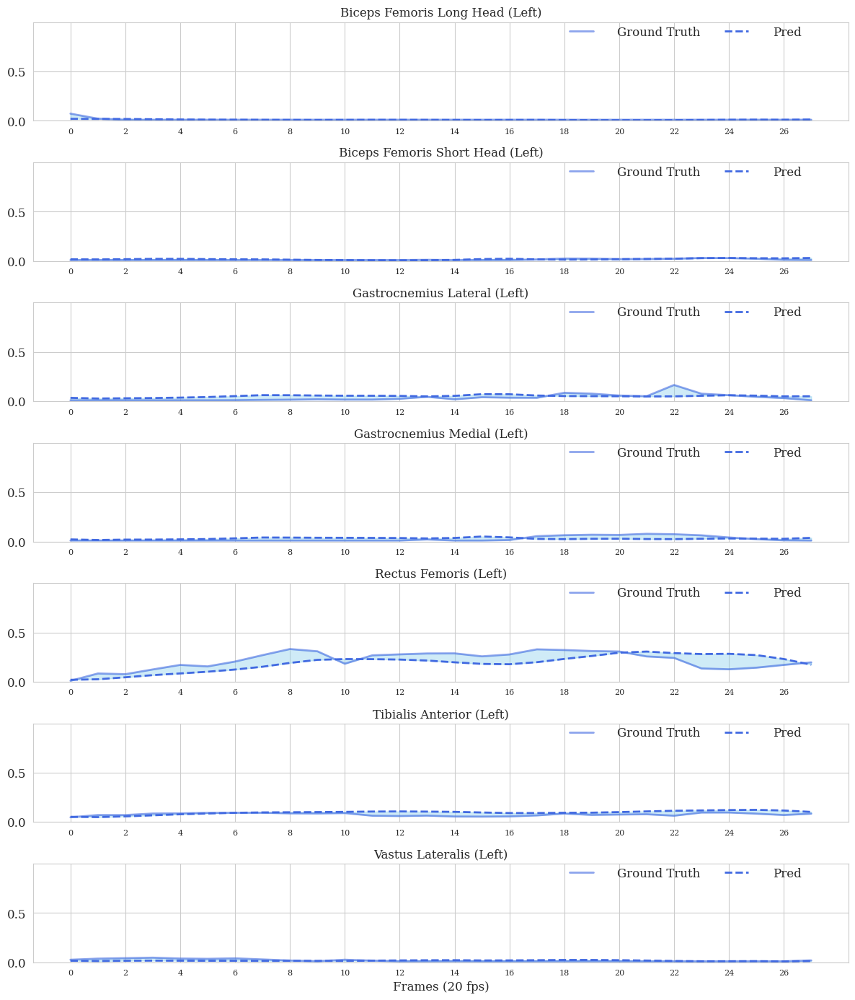

['walk', 'turn']


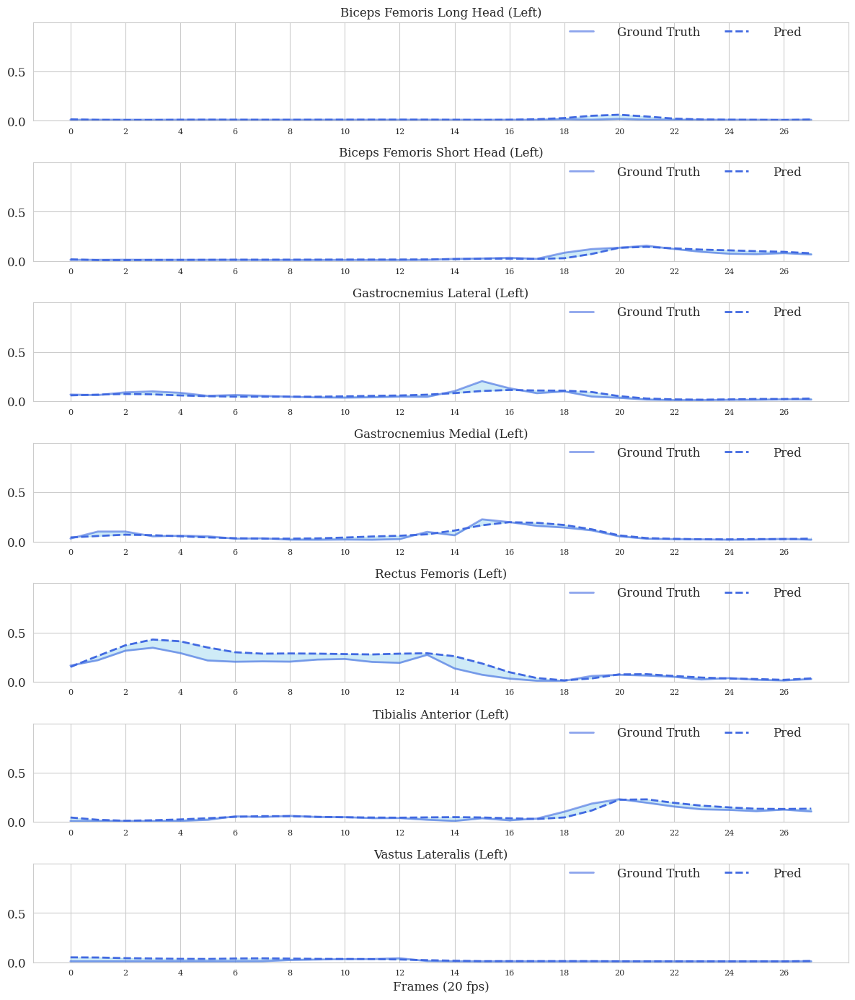

['walk', 'sideways movement']


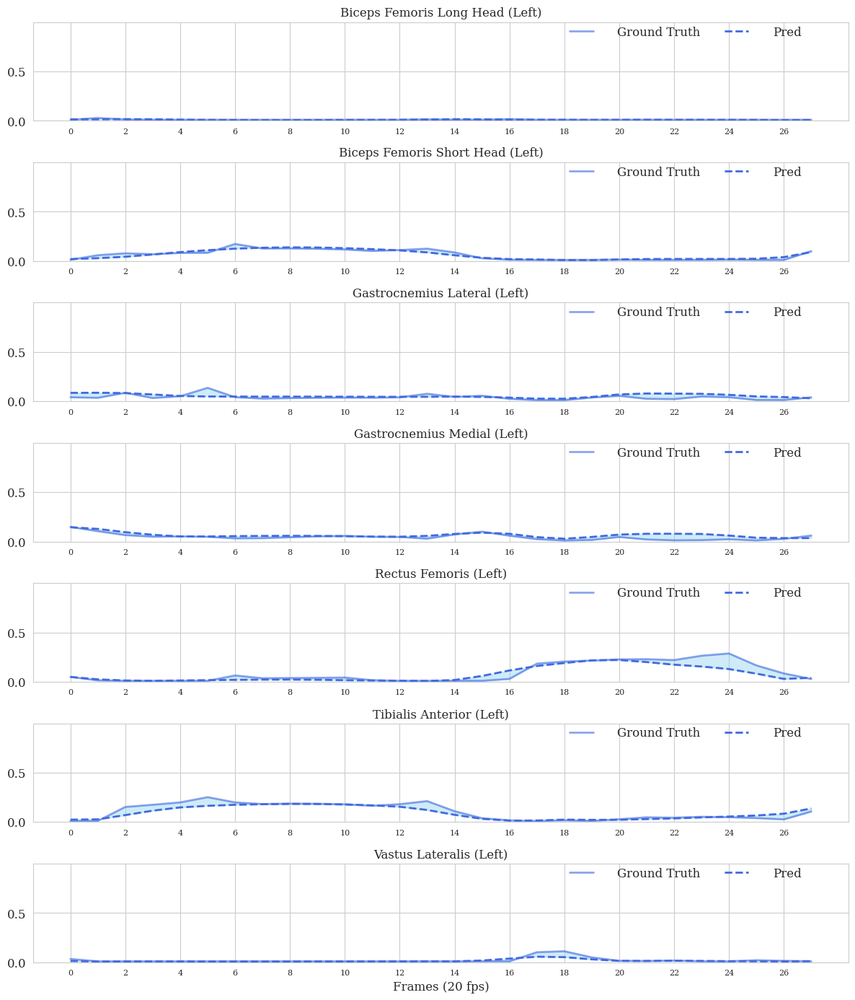

['clap', 'hand movements']


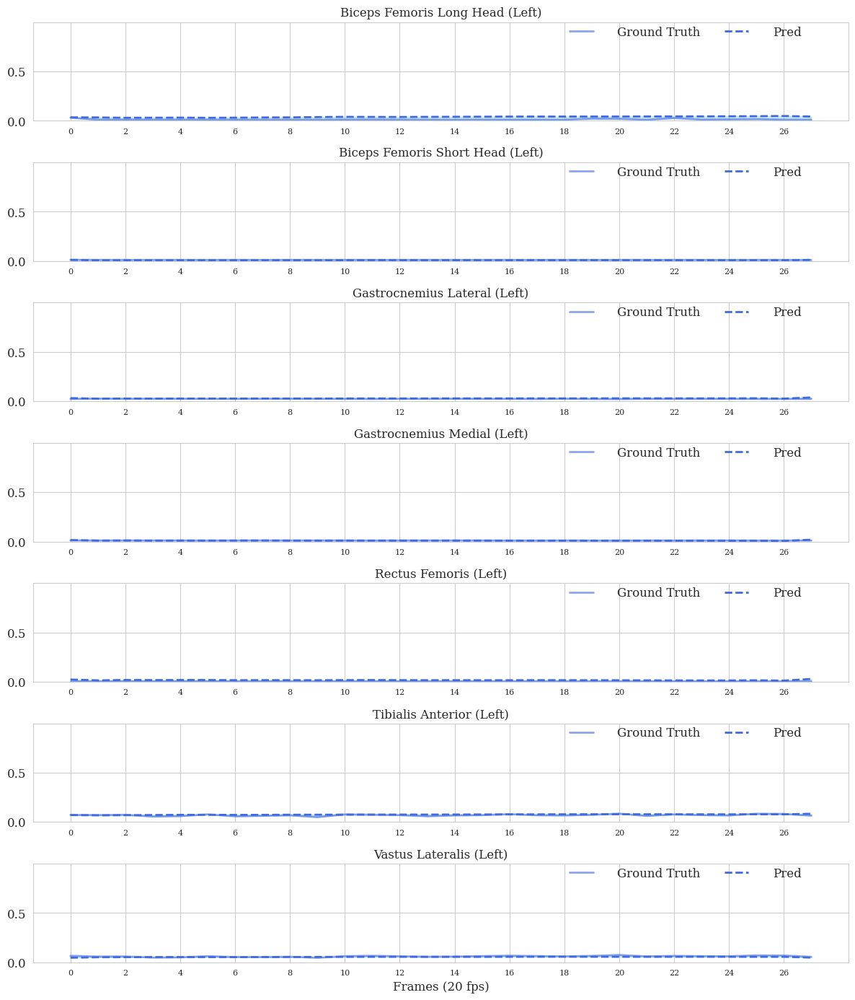

['touching face', 'throw', 'transition', 'stand', 'hand movements', 'action with ball']


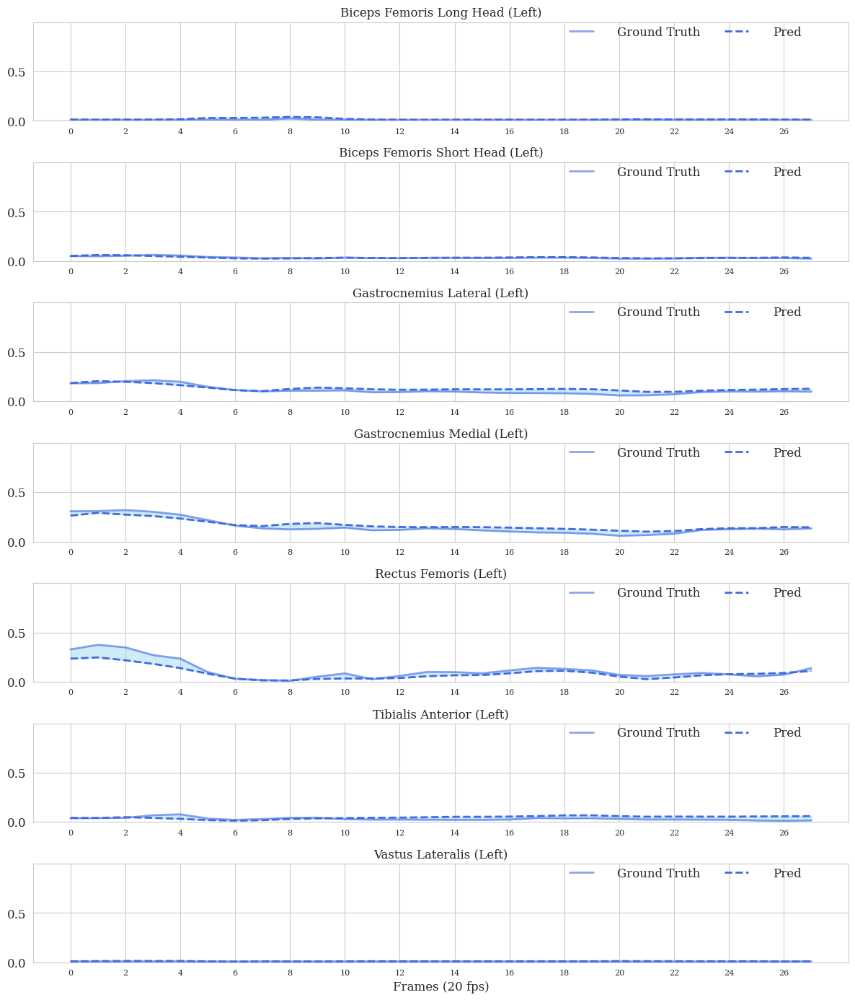

['walk']


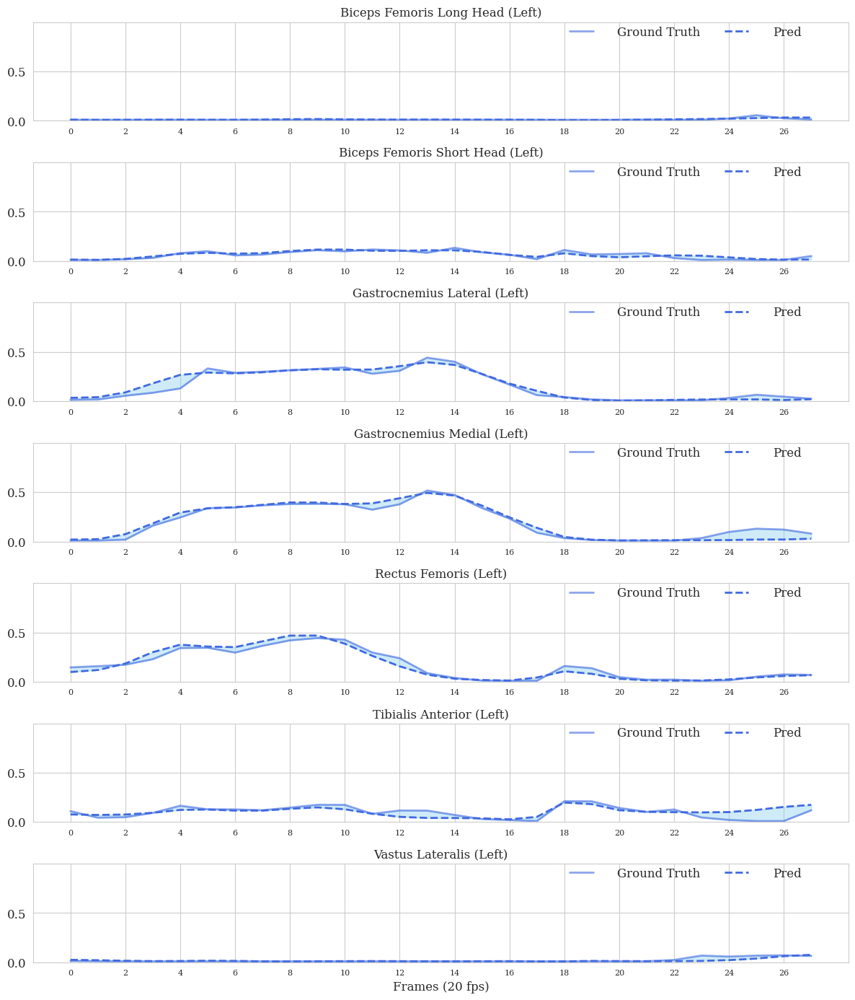

['walk']


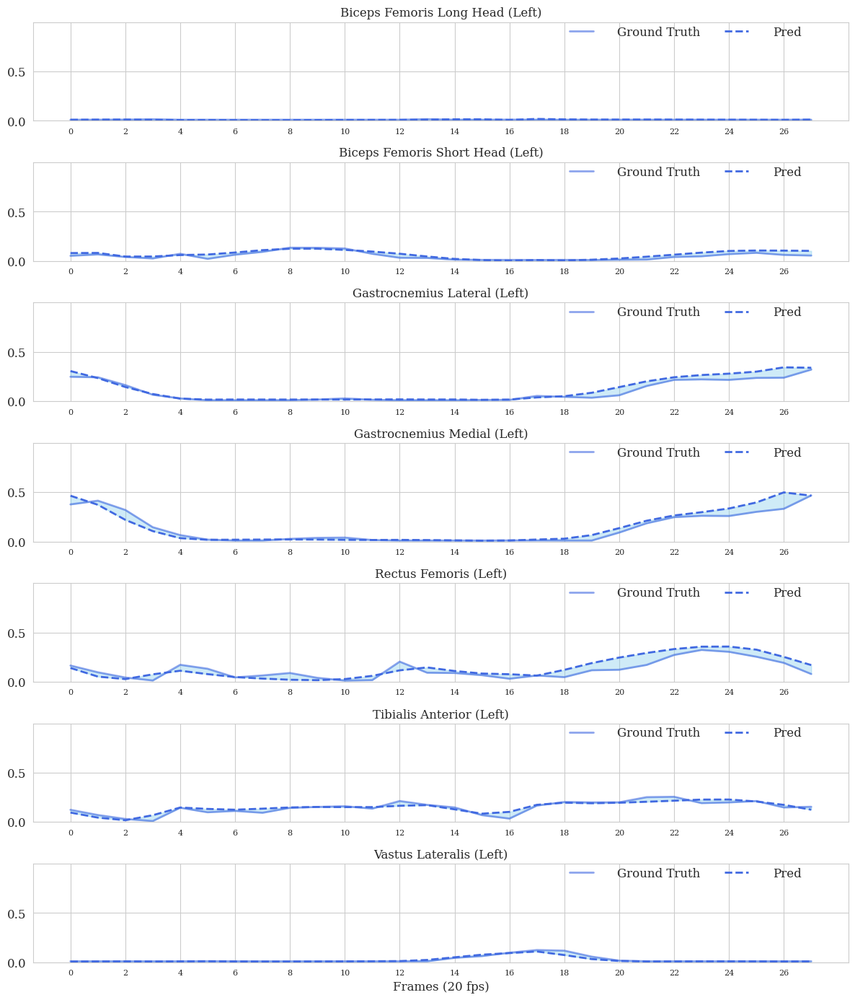

['walk']


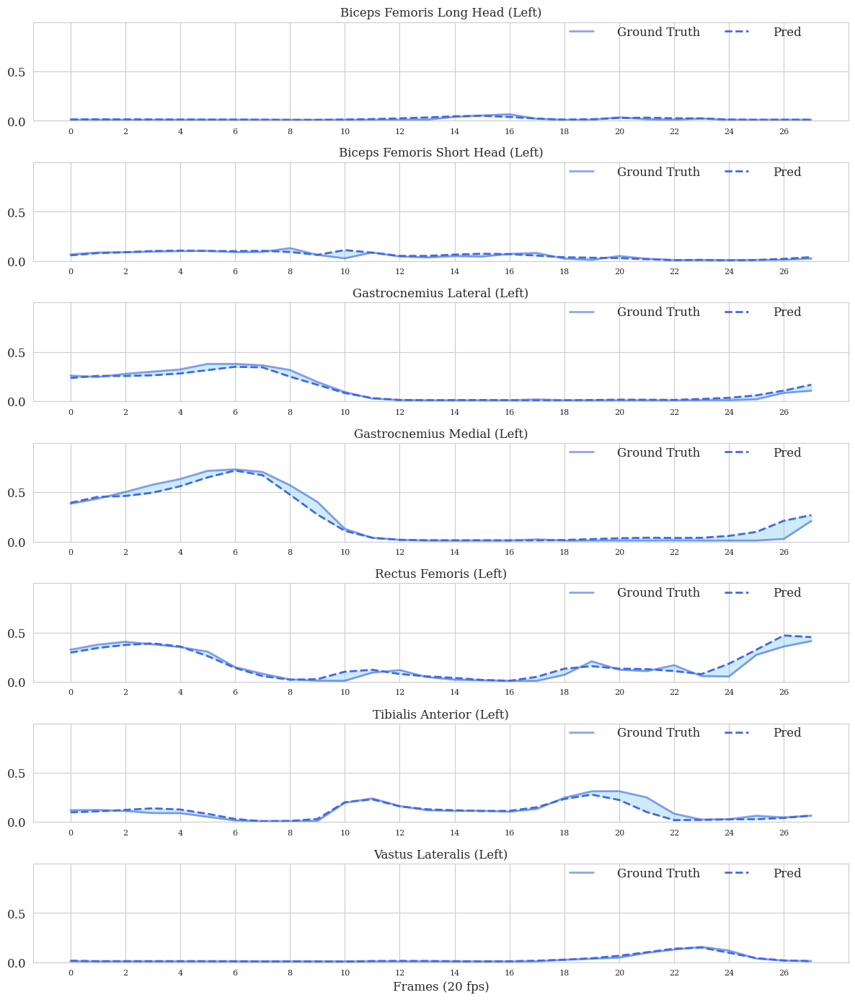

['walk']


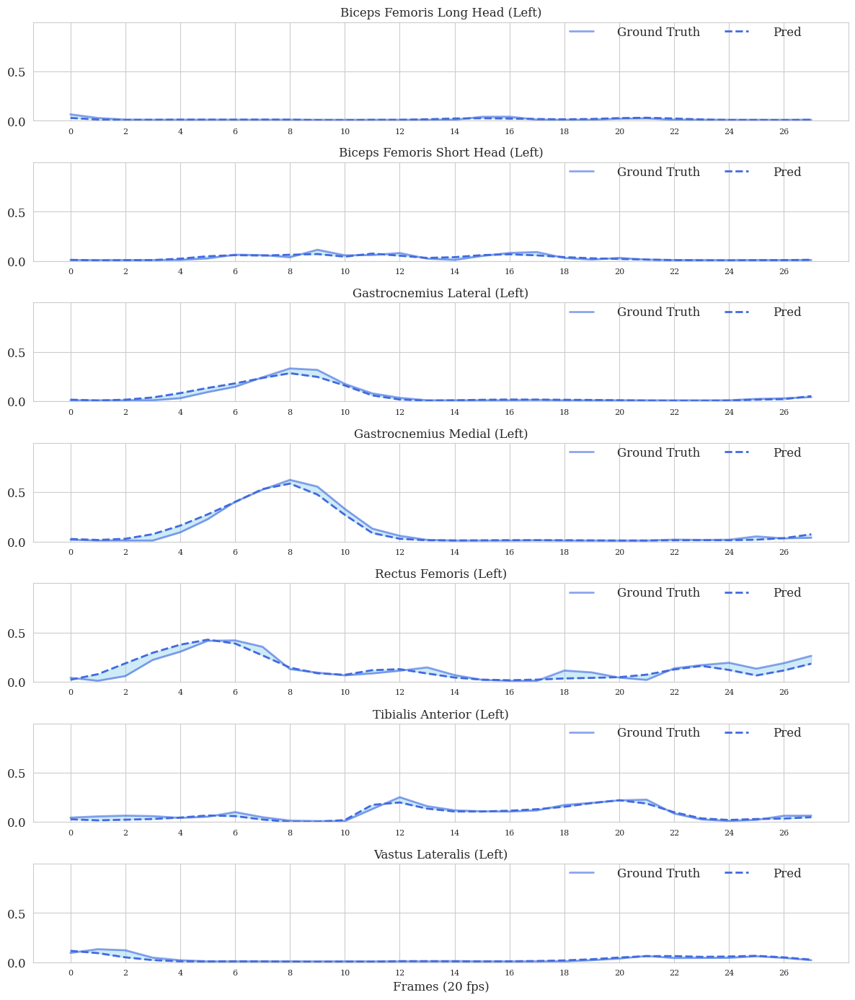

['swing body part', 'leg movements']


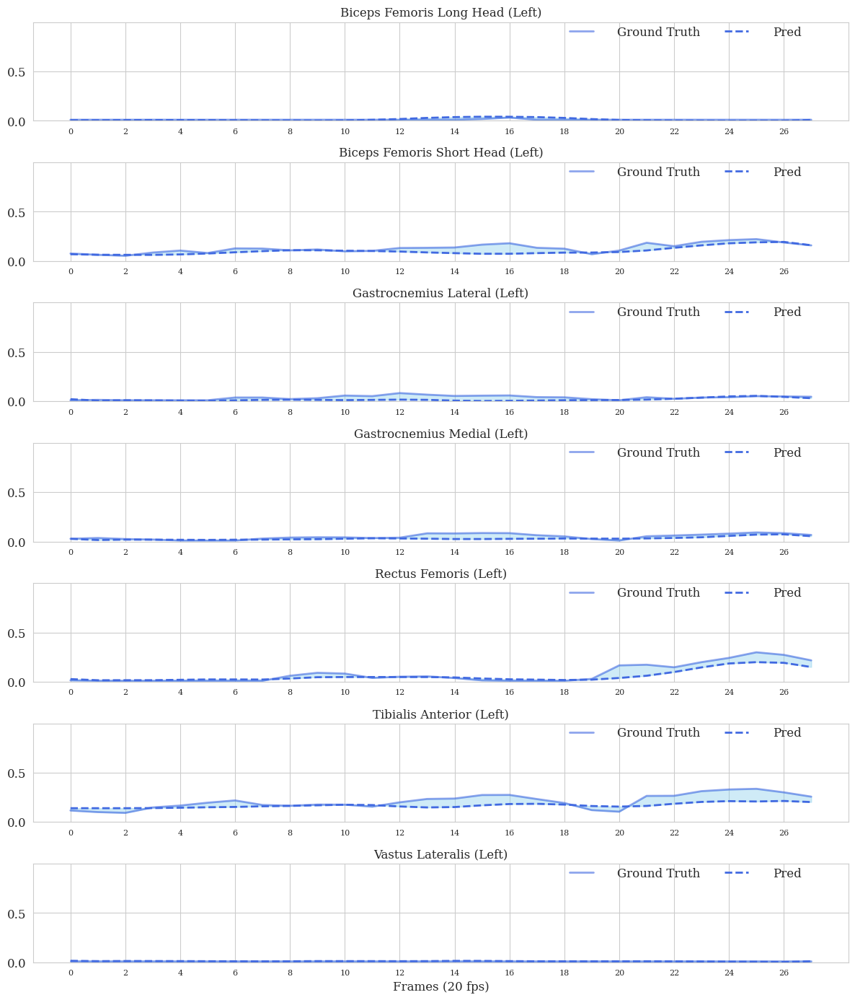

['throw', 'transition', 'catch', 'stand', 'action with ball']


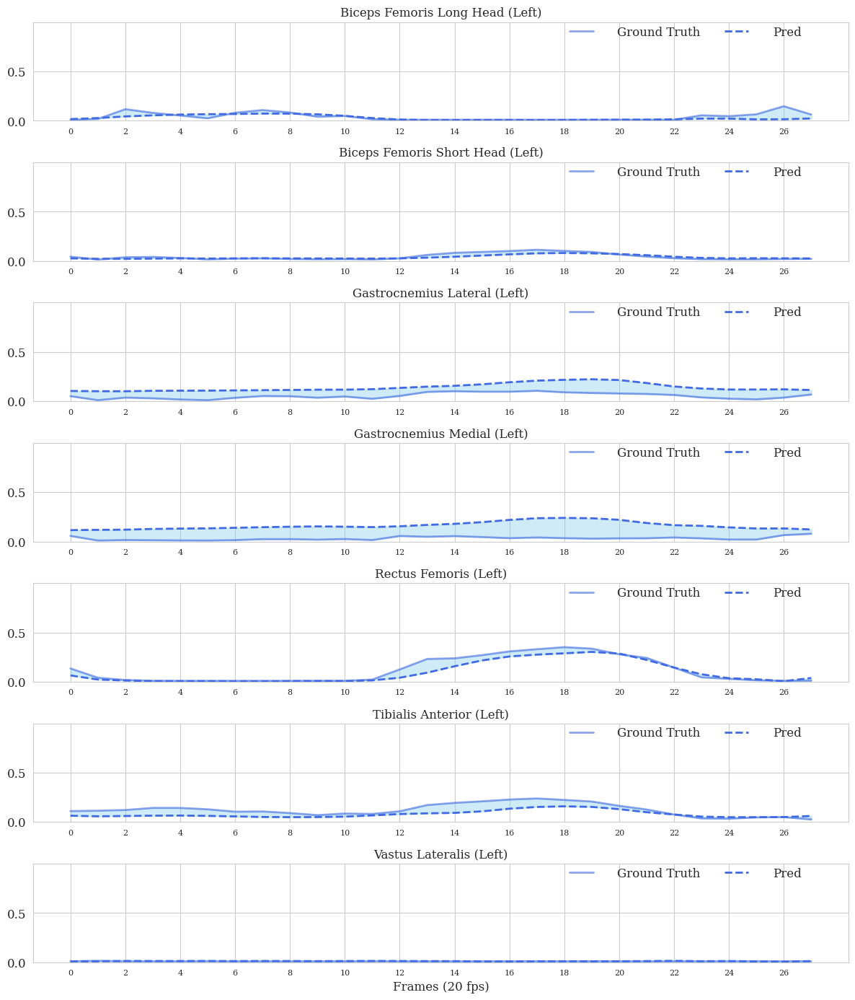

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d

sns.set_style(style="whitegrid")


# Set global plot parameters for consistent styling
plt.rcParams.update(
    {
        "text.usetex": False,
        "font.family": "serif",
        "font.serif": ["DejaVu Serif"],
        "font.sans-serif": ["Helvetica"],
        "figure.figsize": (6, 4.8),  # Figure size
        "font.size": 12,  # Global font size
        "axes.titlesize": 12,  # Title font size
        "axes.labelsize": 12,  # Axes labels font size
        "xtick.labelsize": 12,  # X-tick labels font size
        "ytick.labelsize": 12,  # Y-tick labels font size
        "legend.fontsize": 12,  # Legend font size
        "figure.titlesize": 12,  # Figure title font size
    }
)
os.makedirs('output/aviz', exist_ok=True)

for i, (sample_idx, title) in enumerate(sample_indices):

    row = sub_meta_df.loc[sample_idx]
    print(row["actions"])
    # if not "jump" in row["actions"]:
    #     continue
    # Get ground truth and prediction file names from the row
    gt_file = row["gt_name"]
    pred_file = row["pred_name"]

    gt_path = os.path.join(muscle_act_root, gt_file)
    pred_path = os.path.join(muscle_act_root, pred_file)

    # Load ground truth and prediction data
    gt = np.load(gt_path)[..., muscle_idxs]
    pred = np.load(pred_path)[..., muscle_idxs]

    T, D = gt[0].shape
    plt.figure(figsize=(12, D))

    counter = 0

    for li in range(0, int(len(muscle_idxs) / 2)):
        ri = li + int(len(muscle_idxs) / 2)  # Right index

        muscle_l = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[li]]
        muscle_r = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[ri]]

        muscle_name_l = full_muscle_names[muscle_l]

        counter += 1

        plt.subplot(int(D / 2), 1, counter)

        x = np.arange(len(gt[0][:, li]))
        x_new = np.linspace(x.min(), x.max(), len(x) * 10)

        gt_l = gt[0][:, li]
        gt_r = gt[0][:, ri]

        pred_l = pred[0][:, li]
        # pred_l = interp1d(x, pred_l, kind="cubic")(x_new)

        pred_r = pred[0][:, ri]

        plt.plot(gt_l, label=f"Ground Truth", linewidth=2, color="royalblue", alpha=0.6)
        # plt.plot(gt_r, label=f"Right", linewidth=2, color="orange", alpha=0.6)

        plt.plot(pred_l, label=f"Pred", linestyle="--", linewidth=2, color="royalblue")
        # plt.plot(pred_r, label=f"Pred Right", linestyle="--", linewidth=2, color="orange")

        plt.fill_between(range(len(gt_l)), gt_l, pred_l, color="skyblue", alpha=0.4)
        # plt.fill_between(range(len(gt_r)), gt_r, pred_r, color="orange", alpha=0.4)
        plt.yticks([0, 0.5])
        xticks = np.arange(0, len(x), step=2)
        xtick_labels = [str(tick) for tick in xticks]
        plt.xticks(xticks, xtick_labels, fontsize=8)
        plt.title(f"{muscle_name_l}")

        # plt.ylabel(f"Activation")
        # Hide x-axis for all but the last subplot
        if counter != int(D / 2):
            # plt.yticks([])
            # plt.gca().xaxis.set_ticks([])
            # plt.gca().set_xticklabels([])
            plt.gca().xaxis.grid(True)  # Ensure x-axis grid is visible
        else:
            plt.xlabel("Frames (20 fps)")

        plt.ylim((0, 1.0))
        plt.grid(True)

    # plt.ylabel(f"Activation", y=2.2)
        plt.legend(loc='center', bbox_to_anchor=(0.8, 0.9), ncol=2, frameon=False, handletextpad=2)
    # Reduce the padding
    plt.tight_layout(pad=1.0)
    # Adjust the vertical position of the title
    # plt.suptitle(f"{title} - Muscle Activations", fontsize=14, y=0.88)
    plt.savefig(f"output/aviz/{i}.svg")
    plt.show()

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import imageio
from scipy.interpolate import interp1d
import pandas as pd

sns.set_style(style="whitegrid")

# Set global plot parameters for consistent styling
plt.rcParams.update(
    {
        "text.usetex": False,
        "font.family": "serif",
        "font.serif": ["DejaVu Serif"],
        "font.sans-serif": ["Helvetica"],
        "figure.figsize": (6, 4.8),  # Figure size
        "font.size": 12,  # Global font size
        "axes.titlesize": 12,  # Title font size
        "axes.labelsize": 12,  # Axes labels font size
        "xtick.labelsize": 12,  # X-tick labels font size
        "ytick.labelsize": 12,  # Y-tick labels font size
        "legend.fontsize": 12,  # Legend font size
        "figure.titlesize": 12,  # Figure title font size
    }
)

os.makedirs('output/aviz', exist_ok=True)

image_counter = 0

# Replace this with actual sample indices and muscle indices
sample_indices = [(0, "Sample 1")]
muscle_idxs = list(range(8))

for i, (sample_idx, title) in enumerate(sample_indices):
    row = sub_meta_df.loc[sample_idx]
    print(row["actions"])
    if not "jump" in row["actions"]:
        continue
    gt_file = row["gt_name"]
    pred_file = row["pred_name"]

    gt_path = os.path.join(muscle_act_root, gt_file)
    pred_path = os.path.join(muscle_act_root, pred_file)

    gt = np.load(gt_path)[..., muscle_idxs]
    pred = np.load(pred_path)[..., muscle_idxs]

    T, D = gt[0].shape
    num_subplots = int(len(muscle_idxs) / 2)

    for j in range(1, T + 1):
        fig, axes = plt.subplots(num_subplots, 1, figsize=(12, 4 * num_subplots))

        for counter, li in enumerate(range(0, int(len(muscle_idxs) / 2))):
            ri = li + int(len(muscle_idxs) / 2)  # Right index

            muscle_l = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[li]]
            muscle_r = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[ri]]

            muscle_name_l = full_muscle_names[muscle_l]

            ax = axes[counter] if num_subplots > 1 else axes

            gt_l = gt[0][:j, li]
            pred_l = pred[0][:j, li]

            ax.plot(gt_l, label=f"Left", linewidth=2, color="royalblue", alpha=0.6)
            ax.plot(pred_l, label=f"Pred Left", linestyle="--", linewidth=2, color="royalblue")
            ax.fill_between(range(j), gt_l, pred_l, color="skyblue", alpha=0.4)
            ax.set_yticks([0, 0.5])
            xticks = np.arange(0, T, step=2)
            xtick_labels = [str(tick) for tick in xticks]
            ax.set_xticks(xticks)
            ax.set_xticklabels(xtick_labels, fontsize=8)
            ax.set_title(f"{muscle_name_l} (Left)")
            ax.xaxis.grid(True)  # Ensure x-axis grid is visible
            ax.set_ylim((0, 1.0))
            ax.grid(True)
            if counter == num_subplots - 1:
                ax.set_xlabel("Frames (20 fps)")
            ax.legend(loc='center', bbox_to_anchor=(0.8, 0.9), ncol=2, frameon=False, handletextpad=2)
        
        plt.tight_layout(pad=1.0)
        plt.savefig(f"output/aviz/{image_counter}.png")  # Save the plot as an image
        plt.close(fig)  # Close the plot to release memory
        image_counter += 1

# Get a list of all the image file paths
image_files = [f"output/aviz/{i}.png" for i in range(image_counter)]

# Read the images into a list
images = [imageio.imread(image_file) for image_file in image_files]

# Write the images to a GIF
imageio.mimsave('output/aviz/animation.gif', images)


['throw', 'transition', 'catch', 'interact with/use object', 'action with ball']


ValueError: need at least one array to stack

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.interpolate import interp1d

sns.set_style(style="whitegrid")


# Set global plot parameters for consistent styling
plt.rcParams.update(
    {
        "text.usetex": False,
        "font.family": "serif",
        "font.serif": ["DejaVu Serif"],
        "font.sans-serif": ["Helvetica"],
        "figure.figsize": (6, 4.8),  # Figure size
        "font.size": 12,  # Global font size
        "axes.titlesize": 12,  # Title font size
        "axes.labelsize": 12,  # Axes labels font size
        "xtick.labelsize": 12,  # X-tick labels font size
        "ytick.labelsize": 12,  # Y-tick labels font size
        "legend.fontsize": 12,  # Legend font size
        "figure.titlesize": 12,  # Figure title font size
    }
)


for i, (sample_idx, title) in enumerate(sample_indices):

    row = sub_meta_df.loc[sample_idx]
    print(row["actions"])
    if not "jumping jacks" in row["actions"]:
        continue
    # Get ground truth and prediction file names from the row
    gt_file = row["gt_name"]
    pred_file = row["pred_name"]

    gt_path = os.path.join(muscle_act_root, gt_file)
    pred_path = os.path.join(muscle_act_root, pred_file)

    # Load ground truth and prediction data
    gt = np.load(gt_path)[..., muscle_idxs]
    pred = np.load(pred_path)[..., muscle_idxs]

    T, D = gt[0].shape
    plt.figure(figsize=(12, D))

    counter = 0

    for li in range(0, int(len(muscle_idxs) / 2)):
        ri = li + int(len(muscle_idxs) / 2)  # Right index

        muscle_l = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[li]]
        muscle_r = MUSCLE_SUBSETS["MUSINT_402"][muscle_idxs[ri]]

        muscle_name_l = muscle_l
        muscle_name_r = muscle_r

        counter += 1

        plt.subplot(int(D / 2), 1, counter)

        x = np.arange(len(gt[0][:, li]))
        x_new = np.linspace(x.min(), x.max(), len(x) * 10)

        gt_l = gt[0][:, li]
        gt_r = gt[0][:, ri]

        pred_l = pred[0][:, li]
        # pred_l = interp1d(x, pred_l, kind="cubic")(x_new)

        pred_r = pred[0][:, ri]

        plt.plot(gt_l, label=f"Left", linewidth=2, color="royalblue", alpha=0.6)
        plt.plot(gt_r, label=f"Right", linewidth=2, color="orange", alpha=0.6)

        # plt.plot(pred_l, label=f"Pred Left", linestyle="--", linewidth=2, color="royalblue")
        # plt.plot(pred_r, label=f"Pred Right", linestyle="--", linewidth=2, color="orange")

        # plt.fill_between(range(len(gt_l)), gt_l, pred_l, color="skyblue", alpha=0.4)
        # plt.fill_between(range(len(gt_r)), gt_r, pred_r, color="orange", alpha=0.4)
        plt.yticks([0, 0.5])
        xticks = np.arange(0, len(x), step=2)
        xtick_labels = [str(tick) for tick in xticks]
        plt.xticks(xticks, xtick_labels, fontsize=8)
        plt.title(f"{muscle_name_l[3:-2]}", rotation=90, loc="right", x=1.05, y=0)

        # plt.ylabel(f"Activation")
        # Hide x-axis for all but the last subplot
        if counter != int(D / 2):
            # plt.yticks([])
            # plt.gca().xaxis.set_ticks([])
            # plt.gca().set_xticklabels([])
            plt.gca().xaxis.grid(True)  # Ensure x-axis grid is visible
        else:
            plt.xlabel("Frames (20 fps)")

        plt.ylim((0, 1.0))
        plt.grid(True)

    # plt.ylabel(f"Activation", y=2.2)
        plt.legend(loc='center', bbox_to_anchor=(0.8, 0.9), ncol=2, frameon=False, handletextpad=2)
    # Reduce the padding
    plt.tight_layout(pad=1.0)
    # Adjust the vertical position of the title
    # plt.suptitle(f"{title} - Muscle Activations", fontsize=14, y=0.88)
    plt.savefig(f"output/aviz/{i}.svg")
    plt.show()